<img src =  'https://github.com/padmapriyajain/MyPythonworld/blob/master/C3.png?raw=true' width="3000" height="400">

# INSAID CAPSTONE - TEAM 1009 - TELECOM DATA EDA FOR MAHARASHTRA

## Table of Contents

1. [Project Description](#section1)<br>
    - 1.1 [Project Requirement](#section101)<br>
    - 1.2 [Data Description](#section102)<br>
2. [Import Libraries](#section2)<br>
3. [Import Telecom Datasets](#section3)<br>
    - 3.1 [Import and Extract Maharashtra Events Dataset](#section301)<br> 
    - 3.2 [Import and Gender and Phone Dataset](#section302)<br>
4. [Analyse Telecom Datasets](#section5)<br>
    - 4.1 [Analyse Gender Age Dataset](#section401)<br>
    - 4.2 [Analyse Phone Brand and Device Model Dataset](#section402)<br>
    - 4.3 [Analyse Maharashtra Events Dataset](#section403)<br>
5. [Processing Telecom Datasets](#section5)<br> 
    - 5.1 [Handling Missing Values](#section501)<br>
      - 5.1.1 [Latitude and Longitude in Events Datset](#section50101)<br>
      - 5.1.2 [Device Ids in Events Dataset](#section50102)<br>
    - 5.2 [Handling Outliers](#section502)<br>
     - 5.2.1 [Latitude and Longitude in Event Dataset](#section50201)<br>
     - 5.2.2 [Age in GAT Dataset](#section50202)<br>
    - 5.3 [Generalize Languages in PBDM Dataset](#section503)<br>
    - 5.4 [Construct the Final Datasets for EDA](#section504)<br>
6. [EDA of Telecm Datasets](#section6)<br>
    - 6.1 [Based on Usage](#section601)<br>    
         - 6.1.1 [Usage By Timestamp](#section60101)<br>
         - 6.1.2 [Usage By Age](#section60102)<br>
         - 6.1.3 [Usage By Gender](#section60103)<br>
         - 6.1.4 [Usage By Group](#section60104)<br>
         - 6.1.5 [Usage By Top 10 City](#section60105)<br>
         - 6.1.6 [Usage Peak Hours](#section60106)<br>
    - 6.2 [Based on Users](#section602)<br>    
         - 6.2.1 [Distribution of Users in the top 10 cities](#section60201)<br>
         - 6.2.2 [Distribution of Users by Age](#section60202)<br>
         - 6.2.3 [Distribution of Users by Gender](#section60203)<br>
         - 6.2.4 [Distribution of Users by Age Group and Gender](#section60204)<br>
         - 6.2.5 [Distribution of Users by top 20 Phone Brands](#section60205)<br>
         - 6.2.6 [Distribution of Users by top 50 Device Models](#sectio60206)<br>
         - 6.2.7 [Distribution of users in Mumbai and Pune by age group and gender](#section0207)<br>
         - 6.2.8 [Distribution of users phone brand in Mumbai and Pune by Age and Gender](#section0208)<br>
         - 6.2.9 [Distribution of users in Mumbai and Pune by Phone brand](#section60209)<br>
         - 6.2.10 [Distribution of users in Mumbai and Pune by Device Model](#section60210)<br>
    - 6.3 [Based on Phone Brand and Timestamp](#section603)<br>    
         - 6.3.1 [Market share of Top 10 Brands By All Age Group](#section60301)<br>
         - 6.3.2 [Peak Hours Usage Based on Gender](#section60302)<br>
         - 6.3.3 [Peak Hours based on City](#section60303)<br>
         - 6.3.4 [Peak Hours based on Age](#section60304)<br>
         - 6.3.5 [Peak Hours based on Age group](#section60305)<br>
         - 6.3.6 [Usage By Weekday](#section60306)<br>
         - 6.3.7 [Usage By Weekday for Mumbai and Pune City](#section60307)<br>
         - 6.3.8 [Usage By Weekday and Gender](#section60308)<br>
         - 6.3.9 [Usage By Weekday and Age Group](#section60309)<br>
7. [Conclusion](#section7)
8. [CoreTeam](#sectioc8)
       
     
         


<a id=section1></a>
## 1. Project Description




**InsaidTelecom**, one of the leading telecom players, understands that customizing offering is very important for its business to stay competitive.
Currently, **InsaidTelecom** is seeking to leverage behavioral data from more than 60% of the 50 million mobile devices active daily in India
to help its clients better understand and interact with their audiences.

<a id=section101></a>
### 1.1 Project Requirements

Insaidians are expected to build a **dashboard** to understand
user's **demographics (gender and age)** based on their **app download**, **mobile usage, geolocation, and mobile device properties.**

<a id=section102></a>
### 1.2 Data Description

1> **gender_age_train** - Devices and their respective user gender, age and age_group  
2> **phone_brand_device_model** - device ids, brand, and models phone_brand
note that few brands are in Chinese

> **Brand Name**	---**Brand English Mapping**
  

*    '华为'-----------'Huawei' 
*    '小米'-----------'Xiaomi'  
*    '三星'-----------'Samsung'  
*    'vivo'------------'vivo'  
*    'OPPO'-----------'OPPO'  
*    '魅族'-----------'Meizu'  
*    '酷派'-----------'Coolpad'  
*    '乐视'-----------'LeEco'  
*    '联想'-----------'Lenovo'  
*    'HTC'-----------'HTC' 

3> **events_data** - when a user uses mobile on INSAID Telecom network, the event gets logged in this data.
Each event has an event id, location (lat/long), and the event corresponds to frequency of mobile usage.
timestamp: when the user is using the mobile. 

<a id=section2></a>
## 2. Import Libraries

In [ ]:
# Import the required libraries
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity= 'all'
import folium
from folium.plugins import MarkerCluster
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
sns.set_style('whitegrid')

In [ ]:
# Install the mysql connector
!pip install mysql.connector

Processing /root/.cache/pip/wheels/8c/83/a1/f8b6d4bb1bd6208bbde1608bbfa7557504bed9eaf2ecf8c175/mysql_connector-2.2.9-cp36-cp36m-linux_x86_64.whl


In [ ]:
import mysql.connector
import urllib.request

<a id=section3></a>
## 3. Import Telecom Datasets



<a id=section301></a>
### 3.1 Import and Extract Maharashtra Data

In [ ]:
# Mount the drive where the data file exists
#from google.colab import drive
#drive.mount('/content/gdrive')
#from google.colab import drive
#drive.flush_and_unmount()

In [ ]:
url = "https://www.dropbox.com/s/toqvl0kpy4kyc6n/events_data.csv?dl=1"
u = urllib.request.urlopen(url)
data = u.read()
u.close()

with open('events_data.csv', "wb") as f :
   f.write(data)

299544083

In [ ]:
# Read the file from drive
df_events = pd.read_csv("events_data.csv", dtype = {'device_id': 'str'}) 
#df_events = pd.read_csv("/content/gdrive/My Drive/Capstone_Data_Analytics/events_data.csv")
df_events.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304,2016-05-07 22:52:05,77.225676,28.730140,Delhi,Delhi
1,2955066,4734221357723754978,2016-05-01 20:44:16,88.388361,22.660325,Calcutta,WestBengal
2,605968,-3264499652692492784,2016-05-02 14:23:04,77.256809,28.757906,Delhi,Delhi
3,448114,5731369272434022440,2016-05-03 13:21:16,80.343613,13.153332,Chennai,TamilNadu
4,665740,338888002570799963,2016-05-06 03:51:05,85.997745,23.842609,Bokaro,Jharkhand


In [ ]:
# Basic events information
df_events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 7 columns):
 #   Column     Dtype  
---  ------     -----  
 0   event_id   int64  
 1   device_id  object 
 2   timestamp  object 
 3   longitude  float64
 4   latitude   float64
 5   city       object 
 6   state      object 
dtypes: float64(2), int64(1), object(4)
memory usage: 173.7+ MB


In [ ]:
# Describe the events data
df_events.describe(include='all')

,event_id,device_id,timestamp,longitude,latitude,city,state
count,3.252950e+06,3252497,3252950,3.252527e+06,3.252527e+06,3252950,3252573
unique,NaN,60865,588126,NaN,NaN,933,32
top,NaN,5536513450525271144,2016-05-03 10:00:03,NaN,NaN,Delhi,Delhi
freq,NaN,33426,43,NaN,NaN,744276,751733
mean,1.626476e+06,NaN,NaN,7.815868e+01,2.168851e+01,NaN,NaN
std,9.390459e+05,NaN,NaN,4.235570e+00,5.789111e+00,NaN,NaN
min,1.000000e+00,NaN,NaN,1.256700e+01,8.190110e+00,NaN,NaN
25%,8.132382e+05,NaN,NaN,7.583543e+01,1.780171e+01,NaN,NaN
50%,1.626476e+06,NaN,NaN,7.726814e+01,2.216454e+01,NaN,NaN
75%,2.439713e+06,NaN,NaN,8.031916e+01,2.868278e+01,NaN,NaN


In [ ]:
# Displaying total null values in events data
df_events.isnull().sum()

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state        377
dtype: int64

In [ ]:
# Displaying percentage null values in events data
df_events.isnull().sum()/df_events.isnull().count()*100

event_id     0.000000
device_id    0.013926
timestamp    0.000000
longitude    0.013004
latitude     0.013004
city         0.000000
state        0.011589
dtype: float64

In [ ]:
# Displaying null states data wth column details
df_events_null_state = df_events[df_events["state"].isnull()]
df_events_null_state.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 377 entries, 2931 to 3242228
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   event_id   377 non-null    int64  
 1   device_id  377 non-null    object 
 2   timestamp  377 non-null    object 
 3   longitude  377 non-null    float64
 4   latitude   377 non-null    float64
 5   city       377 non-null    object 
 6   state      0 non-null      object 
dtypes: float64(2), int64(1), object(4)
memory usage: 23.6+ KB


We infer that, in the null states data, there are no null values in the other columns except for state.

In [ ]:
# Unique cities in null states data
df_events_null_state.city.unique()

array(['Pune', 'Visakhapatnam', 'Indore', 'Chennai', 'Delhi',
       'Channapatna', 'Jaipur', 'Gangarampur', 'Arambagh'], dtype=object)

In [ ]:
# Count of missing values for pune city in the null state data
df_events_null_state[df_events_null_state['city'] == 'Pune'].shape

(63, 7)

We infer that in the null state events data, there are 63 events which are recorded from pune city which is the only city from Maharashtra. So we can update the 63 events with state as 'Maharashtra'.

In [ ]:
# Replace state null values with Maharashtra for Pune city
df_events['state'][df_events.city =='Pune'] = df_events['state'][df_events.city =='Pune'].fillna('Maharashtra')

In [ ]:
# Recheck the null missing data
df_events.isnull().sum()

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state        314
dtype: int64

In [ ]:
# Displaying null states data wth column details
df_events_null_state = df_events[df_events["state"].isnull()]
df_events_null_state.city.unique()

array(['Visakhapatnam', 'Indore', 'Chennai', 'Delhi', 'Channapatna',
       'Jaipur', 'Gangarampur', 'Arambagh'], dtype=object)

We infer that, the events data has no missing state values for any city in Maharashtra

In [ ]:
# Filter the data to get only the Maharashtra state values:
df_events_mh = df_events[df_events.state == 'Maharashtra']
df_events_mh.sample(5)

,event_id,device_id,timestamp,longitude,latitude,city,state
1164731,107413,-6168490808227801365,2016-05-02 17:33:56,73.861029,18.573191,Pune,Maharashtra
2526907,2917189,1808808798777018578,2016-05-01 18:01:09,72.865695,19.009217,Mumbai,Maharashtra
786853,2124429,-3482589603385235133,2016-05-03 23:10:37,72.908761,19.049402,Mumbai,Maharashtra
3019578,3041022,-3599536669266450529,2016-05-03 00:36:48,72.843860,19.002350,Mumbai,Maharashtra
3029077,2436945,3475152443729676036,2016-05-04 21:23:48,72.867264,18.991900,Mumbai,Maharashtra


<a id=section302></a>
#### 3.2 Import Gender and Phone Datasets

In [ ]:
conn = mysql.connector.connect(
   host="cpanel.insaid.co",
   user="student",
   passwd="student",
   db="Capstone1")

In [ ]:
# Read the gender_age_train dataset
df_gat = pd.read_sql_query("SELECT * FROM gender_age_train",conn)
df_gat.sample(5)

,device_id,gender,age,group
48867,8680730344969862366,M,30,M29-31
7436,-7243953783465554062,M,31,M29-31
68156,4597931905681246520,M,28,M27-28
12890,-6489256781052041746,M,36,M32-38
10991,-797021157853954838,M,41,M39+


In [ ]:
# Read the phone_brand_device_model dataset
df_pbdm = pd.read_sql_query("SELECT * FROM phone_brand_device_model",conn)
df_pbdm.sample(5)

,device_id,phone_brand,device_model
37114,2381308215383758624,华为,荣耀畅玩4X
30985,-5536247786128800952,OPPO,R8000
25779,-7153691875073949637,小米,红米Note2
82422,199867878894852108,三星,A320t
3431,-1715382640425184114,三星,Galaxy Note 3


Conclusion: We have now rendered 3 datasets:  
1> df_events_mh  
2> df_gat  
3> df_pdbm  

<a id=section4></a>
## 4. Analyse Telecom Datasets

<a id=section401></a>
### 4.1 Gender and Age Dataset

In [ ]:
# Basic info on the data
df_gat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74645 non-null  int64 
 1   gender     74645 non-null  object
 2   age        74645 non-null  int64 
 3   group      74645 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.3+ MB


In [ ]:
# Describe the data
df_gat.describe(include='all')

,device_id,gender,age,group
count,7.464500e+04,74645,74645.000000,74645
unique,NaN,2,NaN,12
top,NaN,M,NaN,M23-26
freq,NaN,47904,NaN,9605
mean,-7.491354e+14,NaN,31.410342,NaN
std,5.327150e+18,NaN,9.868735,NaN
min,-9.223067e+18,NaN,1.000000,NaN
25%,-4.617367e+18,NaN,25.000000,NaN
50%,-1.841362e+16,NaN,29.000000,NaN
75%,4.636656e+18,NaN,36.000000,NaN


In [ ]:
# Get the unique values of the group
df_gat.group.unique()

array(['M32-38', 'M29-31', 'F24-26', 'F33-42', 'F27-28', 'M39+', 'M23-26',
       'M27-28', 'M22-', 'F43+', 'F23-', 'F29-32'], dtype=object)

##### Observations on df_gat dataset:

*   Rows: 74645
*   Columns: 4 (device_id, gender, age, group)
*   No null values
*   Device Id's have negative values
*   gender has 2 values (M, F) and 64.17% of devices are being used by male.
*   age has a min and max value of 1 and 96 which needs to be considered while processing the data.
*   group has 12 unique values and for female ranging from F23- to F43+ and for male ranges from the age ranges from M22- to M39+
*   These groups needs to be checked based on min and max value  
F23 - 10 TO 23  
F43 - 43 TO 96  
M22- = 1-22  
M39+ = 39 - 90  

<a id=section402></a>
### 4.2 Phone Brand and Device Model Dataset

In [ ]:
# Basic info on the data
df_pbdm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   device_id     87726 non-null  int64 
 1   phone_brand   87726 non-null  object
 2   device_model  87726 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.0+ MB


In [ ]:
# Describe the data
df_pbdm.describe(include='all')

,device_id,phone_brand,device_model
count,8.772600e+04,87726,87726
unique,NaN,116,1467
top,NaN,小米,红米note
freq,NaN,21645,3500
mean,-5.212557e+15,NaN,NaN
std,5.330157e+18,NaN,NaN
min,-9.223322e+18,NaN,NaN
25%,-4.623331e+18,NaN,NaN
50%,-3.109802e+16,NaN,NaN
75%,4.635194e+18,NaN,NaN


##### Observations on df_pbdm dataset:

*   Rows: 87726
*   Columns: 3 columns (device_id, phone_brand, device_model)
*   No Null values
*   device_id has negative values
*   phone_brand has 116 unique values and 24.6% of the devices are of the brand 小米 ('Xiaomi').
*   device_model has 1467 unique values and the top device model is '红米note' (Xiaomi Redmi Note)
* We need to convert the chinese language to english language.

<a id=section403></a>
### 4.3 Events Dataset

In [ ]:
# Basic info on the dataset
df_events_mh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 677168 entries, 9 to 3252946
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   event_id   677168 non-null  int64  
 1   device_id  677096 non-null  object 
 2   timestamp  677168 non-null  object 
 3   longitude  677105 non-null  float64
 4   latitude   677105 non-null  float64
 5   city       677168 non-null  object 
 6   state      677168 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 41.3+ MB


In [ ]:
# Converted timestamp to datetime dtype
df_events_mh['timestamp'] = pd.to_datetime(df_events_mh['timestamp'])

In [ ]:
# Recheck the dtypes
df_events_mh.dtypes

event_id              int64
device_id            object
timestamp    datetime64[ns]
longitude           float64
latitude            float64
city                 object
state                object
dtype: object

In [ ]:
# Missing values in the dataset
df_events_mh.isnull().sum()

event_id      0
device_id    72
timestamp     0
longitude    63
latitude     63
city          0
state         0
dtype: int64

In [ ]:
# Describe the dataset
df_events_mh.describe(include='all')

,event_id,device_id,timestamp,longitude,latitude,city,state
count,6.771680e+05,677096,677168,677105.000000,677105.000000,677168,677168
unique,NaN,9010,389909,NaN,NaN,87,1
top,NaN,442842061129641625,2016-05-03 10:00:04,NaN,NaN,Pune,Maharashtra
freq,NaN,6731,14,NaN,NaN,317276,677168
first,NaN,NaN,2016-04-30 23:53:05,NaN,NaN,NaN,NaN
last,NaN,NaN,2016-05-08 00:00:00,NaN,NaN,NaN,NaN
mean,1.622267e+06,NaN,NaN,73.656783,18.886532,NaN,NaN
std,9.408789e+05,NaN,NaN,1.090973,0.548332,NaN,NaN
min,2.246000e+03,NaN,NaN,12.567000,16.703068,NaN,NaN
25%,8.087035e+05,NaN,NaN,72.882871,18.584173,NaN,NaN


##### Observations on df_events_mh:

*    Row: 677105
*    Columns: 7 columns (event_id, device_id, time_stamp, longitude, latitude, city, state)
*    We have null values as following:
     *   device_id : 72
     *   latitude : 63
     *   longitud : 63
*    device_id has negative values
*    We have 87 unique cities and 46.8% of the event recorded has happened in Pune.
*   Device Id is int64 in df_gat and in df_pbdm where as float in df_events_mh

<a id=section5></a>
## 5. Preprocessing Telecom Datasets

<a id=section501></a>
### 5.1 Handling Missing Values

In [ ]:
# Check for duplicates
df_events_mh[df_events_mh.duplicated(keep='first')]

,event_id,device_id,timestamp,longitude,latitude,city,state


We find that, there are no duplicate events recorded.

In [ ]:
# Check for total missing values
df_events_mh.isnull().sum()

event_id      0
device_id    72
timestamp     0
longitude    63
latitude     63
city          0
state         0
dtype: int64

<a id=section50101></a>
#### 5.1.1 Latitude and Longitude values

In [ ]:
display(df_events_mh[df_events_mh['longitude'].isnull()]['city'].unique())
display(df_events_mh[df_events_mh['latitude'].isnull()]['city'].unique())

array(['Pune'], dtype=object)

array(['Pune'], dtype=object)

We infer that the 63 missing longitude and latitude values are only for Pune city.  
So lets fill the missing value with latitude and longitude mode of the pune city.

In [ ]:
df_events_mh['longitude'] = df_events_mh['longitude'].fillna(df_events_mh[df_events_mh['city'] == 'Pune']['longitude'].mode()[0])
df_events_mh['latitude'] = df_events_mh['latitude'].fillna(df_events_mh[df_events_mh['city'] == 'Pune']['latitude'].mode()[0])

In [ ]:
df_events_mh.isnull().sum()

event_id      0
device_id    72
timestamp     0
longitude     0
latitude      0
city          0
state         0
dtype: int64

We see that no null values in latitude and longitude.  
Lets generalize the precision of the latitude and longitude to 4 decimals for ease of analysis.

In [ ]:
df_events_mh['longitude'] = df_events_mh['longitude'].round(decimals=4)
df_events_mh['latitude'] = df_events_mh['latitude'].round(decimals=4)

<a id=section50102></a>
#### 5.1.2 Device Id Values

In [ ]:
# Basic info on sub dataset havinf null device id
df_events_mh_nd = df_events_mh[df_events_mh["device_id"].isnull()]
df_events_mh_nd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72 entries, 45052 to 3135318
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   event_id   72 non-null     int64         
 1   device_id  0 non-null      object        
 2   timestamp  72 non-null     datetime64[ns]
 3   longitude  72 non-null     float64       
 4   latitude   72 non-null     float64       
 5   city       72 non-null     object        
 6   state      72 non-null     object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 4.5+ KB


In [ ]:
df_events_mh_nd.isnull().sum()

event_id      0
device_id    72
timestamp     0
longitude     0
latitude      0
city          0
state         0
dtype: int64

We infer that there are no missing valuesin the other columns of device null dataset.

In [ ]:
df_events_mh_nd['city'].unique()

array(['Pune'], dtype=object)

We infer that, all the null device id events have occured only in Pune city.

In [ ]:
display(df_events_mh_nd['longitude'].unique())
display(df_events_mh_nd['latitude'].unique())

array([73.8628, 73.8602, 73.9265])

array([18.6281, 18.5669, 18.6148])

We infer that, there are 3 unique latitude and longitude values in the null device id dataset.

In [ ]:
display(df_events_mh_nd[df_events_mh_nd['longitude'] == 73.8628]['latitude'].unique())
display(df_events_mh_nd[df_events_mh_nd['longitude'] == 73.8602]['latitude'].unique())
display(df_events_mh_nd[df_events_mh_nd['longitude'] == 73.9265]['latitude'].unique())

array([18.6281])

array([18.5669])

array([18.6148])

We infer that, the unique longitudes pairs with the unique latitudes to represent 3 specific place in Pune.  
Hence we can refer either longitude or latitude.

In [ ]:
display(df_events_mh[df_events_mh['longitude'] == 73.8628]['device_id'].unique())
display(df_events_mh[df_events_mh['longitude'] == 73.8602]['device_id'].unique())
display(df_events_mh[df_events_mh['longitude'] == 73.9265]['device_id'].unique())

array(['9027085705222633039', nan], dtype=object)

array(['8539870903150472243', nan, '6624584284312883436'], dtype=object)

array(['177158571165078698', '-5933373333013104418',
       '8378280200256412874', nan], dtype=object)

In [ ]:
a = df_events_mh[df_events_mh['longitude'] == 73.8628]['device_id'].mode()[0]
b = df_events_mh[df_events_mh['longitude'] == 73.8602]['device_id'].mode()[0]
c = df_events_mh[df_events_mh['longitude'] == 73.9265]['device_id'].mode()[0]
display(a, b, c)

'9027085705222633039'

'8539870903150472243'

'177158571165078698'

Get the mode values of device ids with the 3 unique longitudes and fill the null values in the dataset.

In [ ]:
df_events_mh['device_id'][df_events_mh['longitude'] == 73.8628] = df_events_mh['device_id'][df_events_mh['longitude'] == 73.8628].fillna(a)
df_events_mh['device_id'][df_events_mh['longitude'] == 73.8602] = df_events_mh['device_id'][df_events_mh['longitude'] == 73.8602].fillna(b)
df_events_mh['device_id'][df_events_mh['longitude'] == 73.9265] = df_events_mh['device_id'][df_events_mh['longitude'] == 73.9265].fillna(c)

In [ ]:
df_events_mh.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

We infer that, there are no missing values in the df_events_mh dataset.

<a id=section502></a>
### 5.2 Handling Outliers



<a id=section50201></a>
#### 5.2.1 Latitude and Longitude Outliers in Event Dataset

In [ ]:
# Creating subset for plotting latitude and longitude in map
dataE_map = df_events_mh[['latitude','longitude','city','state']]

# Counting number of duplicates of latitude and longitude
count1 = dataE_map.groupby(['latitude', 'longitude']).size() 
count = pd.DataFrame(count1)
count = count.rename(columns={0: 'DuplicateCounts'})
count.head()

,,DuplicateCounts
latitude,longitude,
16.7031,74.5351,35
16.7163,74.4739,4
16.7164,74.4958,9
16.7180,74.2946,2
16.7191,74.3189,12


In [ ]:
# Removing duplicated in the map data
dataE_map = dataE_map.drop_duplicates(keep='first')
dataE_map.describe(include='all')

,latitude,longitude,city,state
count,9000.000000,9000.000000,9000,9000
unique,NaN,NaN,87,1
top,NaN,NaN,Mumbai,Maharashtra
freq,NaN,NaN,4583,9000
mean,19.149093,73.916739,NaN,NaN
std,0.863802,1.817105,NaN,NaN
min,16.703100,12.567000,NaN,NaN
25%,18.774700,72.870100,NaN,NaN
50%,19.013000,72.915000,NaN,NaN
75%,19.056525,73.933400,NaN,NaN


In [ ]:
# merging the map data with count data to get the duplicatecounts of lat & long
dataE_map = pd.merge(left=dataE_map, right=count, on=['latitude', 'longitude'],how='left')
dataE_map.head()
dataE_map.shape

,latitude,longitude,city,state,DuplicateCounts
0,18.9749,72.8448,Mumbai,Maharashtra,101
1,18.6158,73.8752,Pune,Maharashtra,936
2,18.6191,73.9142,Pune,Maharashtra,163
3,19.0145,72.8746,Mumbai,Maharashtra,168
4,18.5828,73.9388,Pune,Maharashtra,373


(9000, 5)

In [ ]:
dataE_map = dataE_map[dataE_map.latitude > 21]

In [ ]:
dataE_map.head()
dataE_map.shape

,latitude,longitude,city,state,DuplicateCounts
7,21.2557,77.3544,Anjangaon,Maharashtra,173
101,21.0876,75.0827,Amalner,Maharashtra,21
172,21.2676,75.2928,Chopda,Maharashtra,88
198,21.1396,75.8260,Bhusawal,Maharashtra,38
465,21.6073,74.4820,Shahada,Maharashtra,13


(523, 5)

In [ ]:
long_mode = df_events_mh[df_events_mh['city'] == 'Pune']['longitude'].mode()[0]
lat_mode = df_events_mh[df_events_mh['city'] == 'Pune']['latitude'].mode()[0]

In [ ]:
# Plotting latitude & longitude values in map using Folium
map_vis = folium.Map(location=[lat_mode, long_mode], zoom_start=5, tiles='Stamen Terrain')
# Duplicates quartile is created to show different colors for different no. of duplicates
dataE_map['DuplicateCounts_quartile'] = pd.qcut(dataE_map['DuplicateCounts'], 4, labels=False)
# Color dictionary is created to distinguish the duplicates quartile (red shows more duplicates of lat & long data)
colordict = {0: 'blue', 1: 'green', 2: 'orange', 3: 'red'}

for lat, lon, Dc, Dc_q, city, state in zip(dataE_map['latitude'], dataE_map['longitude'], dataE_map['DuplicateCounts'], dataE_map['DuplicateCounts_quartile'], dataE_map['city'], dataE_map['state']):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup = ('City: ' + str(city).capitalize() + '<br>'
                 'State: ' + str(state) + '<br>'
                 'Latitude: ' + str(lat) + '<br>'
                 'Longitude: ' + str(lon) + '<br>'
                 'Lat & Long DuplicateCounts: ' + str(Dc)
                ),
        color='crimson',
        key_on = Dc_q,
        threshold_scale=[0,1,2,3],
        fill_color=colordict[Dc_q],
        fill=True,
        fill_opacity=0.7
        ).add_to(map_vis)

In [ ]:
# Calling the map
map_vis

Visually, there are 3 location points (latitude,longitude) outside of Maharashtra (Located outside India)

In [ ]:
# Using latitude zscore value to extract the three latitude outliers (which are outside maharashtra)
dataE_map1 = dataE_map['latitude']
z = np.abs(stats.zscore(dataE_map1))

In [ ]:
# Finding the latitude values whose Zscore value > 3
dataE_map1 = dataE_map1[(z > 3)]
dataE_map1

6772    41.8719
7536    34.5553
8508    25.2048
Name: latitude, dtype: float64

In [ ]:
# Crosschecking the rows of identified latitudes in map data
dataE_map2 = dataE_map.isin({'latitude': dataE_map1})['latitude']
dataE_map2 = dataE_map[dataE_map2]
dataE_map2

,latitude,longitude,city,state,DuplicateCounts
6772,41.8719,12.5670,Pune,Maharashtra,3
7536,34.5553,69.2075,Pune,Maharashtra,3
8508,25.2048,55.2708,Pune,Maharashtra,3


We see that all 3 datapoints are from pune city, so we shall take the mode value of pune city's lat and long for updating any invalid data.

In [ ]:
long_mode = df_events_mh[df_events_mh.city == 'Pune']['longitude'].mode()[0]
lat_mode = df_events_mh[df_events_mh.city == 'Pune']['latitude'].mode()[0]

In [ ]:
# Plotting latitude & longitude values in map using Folium to crosscheck whether chosen latitude & longitude values are outside maharashtra
map_vis1 = folium.Map(location=[lat_mode, long_mode], zoom_start=5, tiles='Stamen Terrain')

for lat, lon in zip(dataE_map2['latitude'], dataE_map2['longitude']):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup = ('Lat: ' + str(lat) + '<br>'
                 'Long: ' + str(lon) + '<br>'
        ),
        color='crimson',
        fill=True,
        fill_opacity=0.7
        ).add_to(map_vis1)

In [ ]:
# Calling the map
map_vis1

It is confirmed visually that the chosen latitude & longitudes are outside Maharashtra
Each chosen latitude & longitudes have 3 duplicates which means there are total 9 data points which need to be changed
All chosen latitude & longitudes are in Pune location so these can be replaced with mode values of Pune's latitude & longitude

In [ ]:
# Replacing the chosen latitude & longitudes with mode values of Pune's latitude & longitude in Maharashtra data
df_events_mh1 = df_events_mh.copy()
df_events_mh.loc[(df_events_mh.latitude > 25),'longitude']=long_mode
df_events_mh.loc[(df_events_mh.latitude > 25),'latitude']=lat_mode

# Creating subset for plotting latitude and longitude in map
dataE_map3 = df_events_mh[['latitude','longitude','city','state']]

# Removing duplicated in the map data
dataE_map3= dataE_map3.drop_duplicates(keep='first')

In [ ]:
dataE_map3.shape

(8997, 4)

In [ ]:
dataE_map3 = dataE_map3[dataE_map3.latitude > 21]
dataE_map.head()
dataE_map3.shape

,latitude,longitude,city,state,DuplicateCounts
7,21.2557,77.3544,Anjangaon,Maharashtra,173
101,21.0876,75.0827,Amalner,Maharashtra,21
172,21.2676,75.2928,Chopda,Maharashtra,88
198,21.1396,75.8260,Bhusawal,Maharashtra,38
465,21.6073,74.4820,Shahada,Maharashtra,13


(520, 4)

In [ ]:
# Plotting latitude & longitude values in map using Folium to crosscheck whether chosen latitude & longitude values are corrected
map_vis2 = folium.Map(location=[lat_mode, long_mode], zoom_start=5, tiles='Stamen Terrain')

for lat, lon in zip(dataE_map3['latitude'], dataE_map3['longitude']):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup = ('Lat: ' + str(lat) + '<br>'
                 'Long: ' + str(lon) + '<br>'
        ),
        color='crimson',
        fill=True,
        fill_opacity=0.7
        ).add_to(map_vis2)

In [ ]:
# Calling the map
map_vis2

In [ ]:
# Crosschecking whether chosen latitude & longitude values are corrected properly
df_events_mh1[df_events_mh1.latitude != df_events_mh.latitude]

,event_id,device_id,timestamp,longitude,latitude,city,state
218308,451415,-3300282771940051439,2016-05-06 14:37:28,12.5670,41.8719,Pune,Maharashtra
398778,526715,4995976326034236311,2016-05-01 20:58:46,69.2075,34.5553,Pune,Maharashtra
812011,483087,-3300282771940051439,2016-05-01 10:57:32,12.5670,41.8719,Pune,Maharashtra
835763,560421,4995976326034236311,2016-05-04 22:45:37,69.2075,34.5553,Pune,Maharashtra
887261,360331,4995976326034236311,2016-05-07 21:25:54,69.2075,34.5553,Pune,Maharashtra
1262808,298703,436980604655174361,2016-05-01 10:36:32,55.2708,25.2048,Pune,Maharashtra
1550112,311979,-3300282771940051439,2016-05-04 18:12:47,12.5670,41.8719,Pune,Maharashtra
1735938,437167,436980604655174361,2016-05-03 11:22:23,55.2708,25.2048,Pune,Maharashtra
3219531,480535,436980604655174361,2016-05-01 08:15:31,55.2708,25.2048,Pune,Maharashtra


<a id=section50202></a>
#### 5.2.2 Age Outliers in GAT Dataset

In [ ]:
df_gat.describe(include='all')

,device_id,gender,age,group
count,7.464500e+04,74645,74645.000000,74645
unique,NaN,2,NaN,12
top,NaN,M,NaN,M23-26
freq,NaN,47904,NaN,9605
mean,-7.491354e+14,NaN,31.410342,NaN
std,5.327150e+18,NaN,9.868735,NaN
min,-9.223067e+18,NaN,1.000000,NaN
25%,-4.617367e+18,NaN,25.000000,NaN
50%,-1.841362e+16,NaN,29.000000,NaN
75%,4.636656e+18,NaN,36.000000,NaN


<Figure size 1152x360 with 0 Axes>

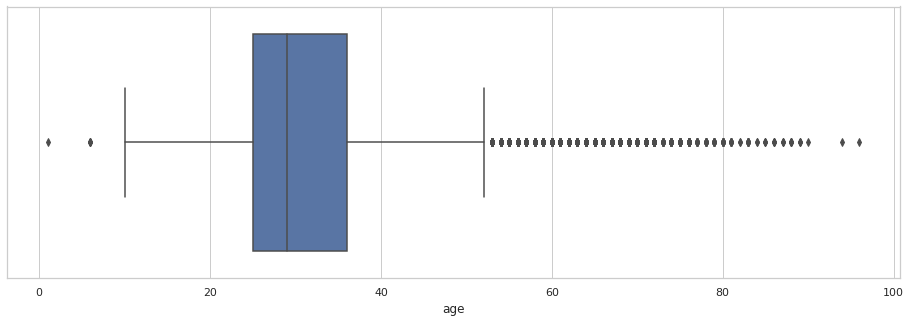

In [ ]:
plt.figure(figsize = (16,5))
sns.boxplot(x = df_gat['age'], )

In [ ]:
# Finding outlier values
df_gat[(df_gat.age >90) | (df_gat.age <5)]
df_gat.shape

,device_id,gender,age,group
5958,-7047596037344697961,F,96,F43+
10385,3553057874282315257,M,1,M22-
60872,1177477789654193646,F,94,F43+


(74645, 4)

In [ ]:
df_gat = df_gat.drop([5958, 10385, 60872], axis = 0)
df_gat[(df_gat.age >90) | (df_gat.age <5)]

,device_id,gender,age,group


We infer that, the outliers are removed for the age column.

<a id=section503></a>
### 5.3 Generalize Languages in PBDM Dataset

In [ ]:
df_pbdm.shape
df_pbdm.sample(5)
df_pbdm.phone_brand.unique()

(87726, 3)

,device_id,phone_brand,device_model
80439,-4494206106415844196,HTC,Sensation XE with Beats Audio Z715e
8309,-5490601993625190514,华为,P8max
58422,-3692374498410115205,三星,Galaxy Note 2
5215,8549023601905866753,三星,Galaxy E7
51385,8093753985588115262,华为,荣耀3C


array(['vivo', '小米', 'OPPO', '三星', '酷派', '联想 ', '华为', '奇酷', '魅族', '斐讯',
       '中国移动', 'HTC', '天语', '至尊宝', 'LG', '欧博信', '优米', 'ZUK', '努比亚', '惠普',
       '尼比鲁', '美图', '乡米', '摩托罗拉', '梦米', '锤子', '富可视', '乐视', '海信', '百立丰',
       '一加', '语信', '海尔', '酷比', '纽曼', '波导', '朵唯', '聆韵', 'TCL', '酷珀', '爱派尔',
       'LOGO', '青葱', '果米', '华硕', '昂达', '艾优尼', '康佳', '优购', '邦华', '赛博宇华',
       '黑米', 'Lovme', '先锋', 'E派', '神舟', '诺基亚', '普耐尔', '糖葫芦', '亿通', '欧新',
       '米奇', '酷比魔方', '蓝魔', '小杨树', '贝尔丰', '糯米', '米歌', 'E人E本', '西米', '大Q',
       '台电', '飞利浦', '唯米', '大显', '长虹', '维图', '青橙', '本为', '虾米', '夏新', '帷幄',
       '百加', 'SUGAR', '欧奇', '世纪星', '智镁', '欧比', '基伍', '飞秒', '德赛', '易派',
       '谷歌', '金星数码', '广信', '诺亚信', 'MIL', '白米', '大可乐', '宝捷讯', '优语', '首云',
       '瑞米', '瑞高', '沃普丰', '摩乐', '鲜米', '凯利通', '唯比', '欧沃', '丰米', '恒宇丰',
       '奥克斯', '西门子', '欧乐迪', 'PPTV'], dtype=object)

We infer that their are phone brands in chinese language names. Let's generalize the values to have only english language for the ease of analysis.

In [ ]:
# Creating dictionary of chinese to english phone brands
brands_in_chinese = ['vivo', '小米', 'OPPO', '三星', '酷派', '联想 ', '华为', '奇酷', '魅族', '斐讯',
       '中国移动', 'HTC', '天语', '至尊宝', 'LG', '欧博信', '优米', 'ZUK', '努比亚', '惠普',
       '尼比鲁', '美图', '乡米', '摩托罗拉', '梦米', '锤子', '富可视', '乐视', '海信', '百立丰',
       '一加', '语信', '海尔', '酷比', '纽曼', '波导', '朵唯', '聆韵', 'TCL', '酷珀', '爱派尔',
       'LOGO', '青葱', '果米', '华硕', '昂达', '艾优尼', '康佳', '优购', '邦华', '赛博宇华',
       '黑米', 'Lovme', '先锋', 'E派', '神舟', '诺基亚', '普耐尔', '糖葫芦', '亿通', '欧新',
       '米奇', '酷比魔方', '蓝魔', '小杨树', '贝尔丰', '糯米', '米歌', 'E人E本', '西米', '大Q',
       '台电', '飞利浦', '唯米', '大显', '长虹', '维图', '青橙', '本为', '虾米', '夏新', '帷幄',
       '百加', 'SUGAR', '欧奇', '世纪星', '智镁', '欧比', '基伍', '飞秒', '德赛', '易派',
       '谷歌', '金星数码', '广信', '诺亚信', 'MIL', '白米', '大可乐', '宝捷讯', '优语', '首云',
       '瑞米', '瑞高', '沃普丰', '摩乐', '鲜米', '凯利通', '唯比', '欧沃', '丰米', '恒宇丰',
       '奥克斯', '西门子', '欧乐迪', 'PPTV']
brands_in_english = ['vivo','Xiaomi','OPPO','Samsung','Cool','Lenovo','Huawei','Qiku','Meizu','Fixuns',
'China Mobile','HTC','Tianyu','Supreme Treasure','LG','Obson','Umi','ZUK','Nubia','HP',
'Nibiru','Meitu','Xianmi','Motorola','Mengmi','Hammer','Focus','LeTV','Hisense','Baifeng', 
'One Plus','Letter','Haier','Coolby','Newman','Wave','Duowei','Listening Rhyme','TCL','Cupper','Aipal ',
'LOGO','Green Onion','Guomi','ASUS','Onda','Ai Youni','Konka','Yougo','Banghua','Saibo Yuhua',
'Black Rice','Lovme','Pioneer','E Pie','Shenzhou','Nokia','Pnell','Candied Gourd','Yitong','Osin',
'Mickey','Rubiks Cube','Blue Devil','Little Poplar','Belfong','Glutinous Rice','Mige','Eren Eben','Simi','Big Q' ,'Taipower','Philips','Wei Mi','Da Xian','Changhong','Weitu','Green Orange','Original','Shrimp','Xia Xin','Xiao','Baiga','SUGAR','Ouqi','Century Star','Chi Magnesium','Obi','Kivu','Femtosecond','Desai','Epai',
'Google','Venus Digital','Guangxin','Noah','MIL','Bai Mi','Big Cola','Bao Jie Xun','Youyu','Shouyun',
'Rumi','Rigao','Wopfung','Mole','Fresh Rice','Kellystone','Vibe','Ovo','Fungmi','Hengyufeng ',
'Aux','Siemens','Oledi','PPTV']

brands_dict1 = dict(zip(brands_in_chinese, brands_in_english))

In [ ]:
# Chinese words in phone_brand data in converted to english using lambda function
df_pbdm.phone_brand = df_pbdm.phone_brand.apply(lambda val: brands_dict1[val] if val in brands_dict1 else val)

In [ ]:
df_pbdm.phone_brand.unique()

array(['vivo', 'Xiaomi', 'OPPO', 'Samsung', 'Cool', 'Lenovo', 'Huawei',
       'Qiku', 'Meizu', 'Fixuns', 'China Mobile', 'HTC', 'Tianyu',
       'Supreme Treasure', 'LG', 'Obson', 'Umi', 'ZUK', 'Nubia', 'HP',
       'Nibiru', 'Meitu', 'Xianmi', 'Motorola', 'Mengmi', 'Hammer',
       'Focus', 'LeTV', 'Hisense', 'Baifeng', 'One Plus', 'Letter',
       'Haier', 'Coolby', 'Newman', 'Wave', 'Duowei', 'Listening Rhyme',
       'TCL', 'Cupper', 'Aipal ', 'LOGO', 'Green Onion', 'Guomi', 'ASUS',
       'Onda', 'Ai Youni', 'Konka', 'Yougo', 'Banghua', 'Saibo Yuhua',
       'Black Rice', 'Lovme', 'Pioneer', 'E Pie', 'Shenzhou', 'Nokia',
       'Pnell', 'Candied Gourd', 'Yitong', 'Osin', 'Mickey',
       'Rubiks Cube', 'Blue Devil', 'Little Poplar', 'Belfong',
       'Glutinous Rice', 'Mige', 'Eren Eben', 'Simi', 'Big Q', 'Taipower',
       'Philips', 'Wei Mi', 'Da Xian', 'Changhong', 'Weitu',
       'Green Orange', 'Original', 'Shrimp', 'Xia Xin', 'Xiao', 'Baiga',
       'SUGAR', 'Ouqi', 'Centur

We infer that, their are no chinese phone brand names in the dataset.

In [ ]:
# Getting the unique values in device_model data
df_pbdm.device_model.unique()

array(['Y13', 'V183', 'R7s', ..., 'Galaxy Tab S T705', 'IVO 8800',
       'U59GT'], dtype=object)

There are many values in the device model, so to find only the chinese language models, we need a better technique.

In [ ]:
import re

In [ ]:
# Finding the unique chinese words in the device_model data using "re" library
def dmodel_Chinese(dev_model): 
    for x in dev_model: 
        if re.search("[\u4e00-\u9FFF]", x):
            chinese_dmodel.append(x)
    return chinese_dmodel

chinese_dmodel = []
chinese_dmodel = dmodel_Chinese(df_pbdm.device_model)
chinese_dmodel = set(chinese_dmodel)
print(chinese_dmodel)

{'荣耀畅玩4X', '超级手机1s', '2016版 Galaxy J7', '2016版 Galaxy A9', '黄金斗士Note8', '大神F2', '天鉴W900S', '黄金斗士青春版', '青春版', '天鉴W900', '红米', '大神Note3', '红辣椒Note', '飞马3', '飞马', '金刚II', '联想黄金斗士S8', '超级手机Max', '荣耀3C', '野火S', '乐檬X3', '2016版 Galaxy A7', '倾城L3', '威武3', '红辣椒任性版 Plus', '魅蓝2', '春雷HD', '荣耀6', '超级手机1', '小苹果', 'Z9 mini 精英版', '红米note增强版', '金钢', '火星一号探索版', '么么哒', '联想VIBE X2', '红米Note2', '麦芒4', 'ivvi 小i', '荣耀畅玩5X', '旗舰版', '黄金斗士A8', '小辣椒 M3', '魅蓝NOTE', '么么哒3S', '小辣椒 9', '大观铂顿', '火星一号', '雷霆战机', '魅蓝Note 2', '荣耀3C畅玩版', '魅蓝Note3', '荣耀3X畅玩版', '荣耀7i', '小辣椒 3', '领世旗舰3', '2016版 Galaxy A5', '醉享', '小辣椒 5', '魅蓝', '红牛V5', 'Mate 7 青春版', '畅享5', '7295A青春版', '大器3', 'note顶配版', '红米2', '倾城L3C', '荣耀畅玩4', '锋尚Pro', '大神F2全高清版', '大神F1Plus', '星星1号', 'Xperia Z1 炫彩版', '小辣椒X4', '远航3', '小鲜3', '大神Note', '畅享5S', 'Moto X极', 'ivvi 小骨Pro', '小鲜2', '纽扣', '红辣椒', '小辣椒 M2', '小辣椒 6', '荣耀7', '风华3', 'T03锋至版', '土星一号', '威武3C', '荣耀3X', '黄金斗士S8畅玩版', '大神1s', '荣耀6 Plus', '大器2', '红米1S', '天鉴T1', '红米3', '天鉴W808', '荣耀畅玩平板T1', '荣耀平板T1-823L', '魅蓝metal',

In [ ]:
# Creating dictionary of chinese to english device models
device_in_chinese = ['乐檬3', '飞马3', 'ivvi 小i', '2016版 Galaxy A5', 'Z9 mini 精英版', '金刚II', '小辣椒 9', 
                     '锋尚2', 'Xperia Z1 炫彩版', '天鉴W900', '小鲜3', '大观铂顿', '威武3', '荣耀U8860', '联想VIBE X2', 
                     '青漾3', '红辣椒XM', '小辣椒 6', '小辣椒 4', '小辣椒 7', 'metal 标准版', 'My 布拉格', '大神Note', 
                     '红米3', '荣耀畅玩4C', '金钢', '超级手机1', '三星big foot', '黄金斗士Note8', 'note顶配版', '飞马2 Plus', 
                     '小鲜2', '大神F2', '么么哒3N', '红米2', '大神1s', '红辣椒NX Plus', '天鉴W900S', '大神F2全高清版', 
                     '星星1号', '乐檬K31', '荣耀7i', 'Razr V锋芒', '黄金斗士S8畅玩版', 'ivvi 小骨Pro', '小章鱼', '么么哒3S', 
                     '锋尚Max', '小辣椒 5', '荣耀6 Plus', '坚果手机', '2016版 Galaxy A7', '黄金斗士A8', '魅蓝NOTE', 
                     'TALK 7X四核', '小辣椒X4', '荣耀X2', '联想黄金斗士S8', '大Q Note', '荣耀平板T1-823L', '乐玩', '乐檬X3', 
                     '荣耀6 plus', '魅蓝', '畅享5', '火星一号', '魅蓝metal', '乐檬K3', '荣耀6', '雷霆战机', '荣耀3C畅玩版', 
                     '荣耀7', '魔镜 X5', '小辣椒 M2', '大观4', '微客', '荣耀4A', '领世旗舰3', '2016版 Galaxy A9', 
                     '黄金斗士青春版', '荣耀畅玩5X', '青春版', '春雷HD', '远航3', '7295A青春版', '时尚手机', '乐檬K3 Note', 
                     '倾城L3C', '小苹果', '荣耀+', 'Axon天机', '荣耀3X畅玩版', '红米Note2', '红米', '红辣椒 X1', '大神F1Plus', 
                     '红米note', '麦芒3', '锋尚Pro', '炫影S+', '醉享', '荣耀畅玩4X', '红米note增强版', '渴望HD', '倾城L3', 
                     '灵感XL', '畅享5S', '威武3C', '天鉴W808', '荣耀畅玩4C运动版', '小辣椒S1', 'Moto X极', '红米Note3', 
                     '超级手机1 Pro', '小星星', '大器3', '魅蓝Note 2', '锋尚', '乐玩2C', '小辣椒 X3', '旋影90w', '荣耀畅玩4', 
                     '魅蓝2', '旗舰版', '荣耀畅玩5', 'Mate 7 青春版', '火星一号探索版', '天鉴T1', '红牛V5', '荣耀畅玩平板T1', 
                     '红辣椒', '大器2', '风华3', '土星一号', '魅蓝Note3', '荣耀3X', '红辣椒Note3', '大神Note3', '麦芒3S', 
                     '红米1S', '麦芒4', '大神X7', '小米note', '飞马', '红辣椒任性版 Plus', '小辣椒 M3', '么么哒', '小辣椒 3', 
                     'T03锋至版', '星星2号', '大神F1', '红米2A', '小米4C', '纽扣', '红辣椒Note', '野火S', '中兴远航3', 
                     '超级手机1s', '超级手机Max', '2016版 Galaxy J7', '荣耀3C']
device_in_english = ['Le Meng 3','Pegasus 3','ivvi Little i', '2016 version of Galaxy A5','Z9 mini Elite','Vajra II',
                     'Little Pepper 9','Feng Shang 2', ' Xperia Z1 Colorful Edition','Tianjian W900','Xiao Xian 3',
                     'Grand View Platinum','Mighty 3','Honor U8860','Lenovo VIBE X2','Blue 3','Red Pepper XM',
                     'Little Pepper 6','Little Pepper 4','Little Pepper 7','Metal Standard','My Prague','Great God Note',
                     'Redmi 3','Honor Play 4C', 'Jin Gang','Super Phone 1','Samsung big foot','Golden Fighter Note8',
                     'note top version','Pegasus 2 Plus','Xiao Xian 2','Great God F2', ' Me Da 3N','Redmi 2',
                     'Great God 1s','Red Pepper NX Plus','Tianjian W900S','Great God F2 Full HD Version','Star 1',
                     'Le Lemon K31', ' Glory 7i','Razr V Fengmang','Golden Fighter S8 Play Edition','ivvi Little Bone Pro',
                     'Little Octopus','Mo Mo Da 3S','Feng Shang Max','Little Pepper 5', ' Honor 6 Plus','Nuts Phone', 
                     '2016 Galaxy A7','Golden Fighter A8','Charm Blue NOTE','TALK 7X Quad Core','Little Pepper X4',
                     'Honor X2','Lenovo Gold Gladiator S8','Big Q Note','Honor Tablet T1-823L','Lewan','Lemon X3',
                     'Honor 6 plus','Charm Blue','Enjoy 5','Mars One ','Charm Blue Metal','Le Meng K3','Honor 6',
                     'Thunder Fighter','Honor 3C Play Edition','Honor 7','Magic Mirror X5','Little Pepper M2', 
                     'Daguan 4','Weike','Glory 4A','Leadership Flagship 3', '2016 Galaxy A9','Golden Fighter Youth Edition',
                     'Glory Play 5X','Youth Edition','Spring Lei HD','Yuanhang 3', '7295A Youth Edition','Fashion Phone',
                     'Le Meng K3 Note','Qingcheng L3C','Little Apple','Glory+','Axon Sky Machine',
                     'Glory 3X Chang Play Edition','Redmi Note2','Redmi','Red Pepper X1','Great God F1Plus',
                     'Redmi Note','Mai Mang 3','Feng Shang Pro','Hyun Shadow S+', ' Drunken Enjoy','Honor Play 4X',
                     'Redmi Note Enhanced Edition','Longing HD','Allure L3','Inspiration XL','Enjoy 5S','Powerful 3C',
                     'Tianjian W808' ,'Honor Play 4C Sports Edition','Little Pepper S1','Moto X Pole','Redmi Note3',
                     'Super Phone 1 Pro','Little Star','Big 3','Charm Blue Note 2','Feng Shang','Lewan 2C',
                     'Little Pepper X3','Xuanying 90w','Honor Play 4','Charm Blue 2','Flagship','Honor Play 5' ,
                     'Mate 7 Youth Edition','Mars One Exploration Edition','Tianjian T1','Red Bull V5','Honor Play T1',
                     'Red Chili','Big 2','Fenghua 3' ,'Saturn One','Charm Blue Note3','Glory 3X','Red Chili Note3',
                     'Great God Note3','Maimang 3S','Redmi 1S','Maimang 4','Great God X7', 'Xiaomi Note','Pegasus',
                     'Red Pepper Capricious Edition Plus','Little Pepper M3','Mo Mo Da','Little Pepper 3',
                     'T03 Fengzhi Edition','Xingxing 2', ' Great God F1','Redmi 2A','Xiaomi 4C','Button',
                     'Red Chili Note','Wildfire S','ZTE Voyage 3','Super Phone 1s','Super Phone Max', 
                     '2016 Edition Galaxy J7','Honor 3C']

device_dict1 = dict(zip(device_in_chinese, device_in_english))

In [ ]:
# Chinese words in device_model data in converted to english using lambda function
df_pbdm.device_model = df_pbdm.device_model.apply(lambda val: device_dict1[val] if val in device_dict1 else val)

In [ ]:
# Finding the unique chinese words in the device_model data using "re" library
def dmodel_Chinese(dev_model): 
    for x in dev_model: 
        if re.search("[\u4e00-\u9FFF]", x):
            chinese_dmodel.append(x)
    return chinese_dmodel

chinese_dmodel = []
chinese_dmodel = dmodel_Chinese(df_pbdm.device_model)
chinese_dmodel = set(chinese_dmodel)
print(chinese_dmodel)

set()


We infer that, their are no chinese model names in the dataset.

<a id=section504></a>
### 5.4 Construct the Final Dataset

In [ ]:
# Main Events table
df_events_mh1.shape
df_events_mh1.info()

(677168, 7)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 677168 entries, 9 to 3252946
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   event_id   677168 non-null  int64         
 1   device_id  677168 non-null  object        
 2   timestamp  677168 non-null  datetime64[ns]
 3   longitude  677168 non-null  float64       
 4   latitude   677168 non-null  float64       
 5   city       677168 non-null  object        
 6   state      677168 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 41.3+ MB


In [ ]:
# Mapping phone brand and model table
df_pbdm.shape
df_pbdm.info()

(87726, 3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   device_id     87726 non-null  int64 
 1   phone_brand   87726 non-null  object
 2   device_model  87726 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.0+ MB


In [ ]:
# Mapping age and gender table
df_gat.shape
df_gat.info()

(74642, 4)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74642 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74642 non-null  int64 
 1   gender     74642 non-null  object
 2   age        74642 non-null  int64 
 3   group      74642 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.8+ MB


We infer that, the device_id is float64 in events dataset and int64 in phone brand model and age gender dataset.

In [ ]:
# changing device_id to float in other data tables
df_pbdm['device_id'] = df_pbdm['device_id'].astype('str')
df_gat['device_id'] = df_gat['device_id'].astype('str')

In [ ]:
display(df_events_mh1.device_id.dtypes)
display(df_pbdm.device_id.dtypes)
display(df_gat.device_id.dtypes)

dtype('O')

dtype('O')

dtype('O')

In [ ]:
# Merging events data & phone_brand_device_model data
df_events_pbdm = pd.merge(left=df_events_mh1, right=df_pbdm, left_on='device_id', right_on='device_id',how='left')

In [ ]:
df_events_pbdm.info()
df_events_pbdm.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 677168 entries, 0 to 677167
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   event_id      677168 non-null  int64         
 1   device_id     677168 non-null  object        
 2   timestamp     677168 non-null  datetime64[ns]
 3   longitude     677168 non-null  float64       
 4   latitude      677168 non-null  float64       
 5   city          677168 non-null  object        
 6   state         677168 non-null  object        
 7   phone_brand   677168 non-null  object        
 8   device_model  677168 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(5)
memory usage: 51.7+ MB


event_id        0
device_id       0
timestamp       0
longitude       0
latitude        0
city            0
state           0
phone_brand     0
device_model    0
dtype: int64

In [ ]:
# Merging events data, phone_brand_device_model data & gender_age_train data
df_usage_mh = pd.merge(left= df_events_pbdm, right=df_gat, left_on='device_id', right_on='device_id',how='left')

In [ ]:
df_usage_mh.info()
df_usage_mh.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 677168 entries, 0 to 677167
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   event_id      677168 non-null  int64         
 1   device_id     677168 non-null  object        
 2   timestamp     677168 non-null  datetime64[ns]
 3   longitude     677168 non-null  float64       
 4   latitude      677168 non-null  float64       
 5   city          677168 non-null  object        
 6   state         677168 non-null  object        
 7   phone_brand   677168 non-null  object        
 8   device_model  677168 non-null  object        
 9   gender        677168 non-null  object        
 10  age           677168 non-null  int64         
 11  group         677168 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(7)
memory usage: 67.2+ MB


event_id        0
device_id       0
timestamp       0
longitude       0
latitude        0
city            0
state           0
phone_brand     0
device_model    0
gender          0
age             0
group           0
dtype: int64

In [ ]:
gat_group_min = pd.DataFrame(df_usage_mh.groupby('group')['age'].min())
gat_group_max = pd.DataFrame(df_usage_mh.groupby('group')['age'].max())
gat_group_min.rename(columns = {'age': 'age_min'}, inplace = True)
gat_group_max.rename(columns = {'age': 'age_max'}, inplace = True)
gat_group_min.reset_index(inplace=True)
gat_group_max.reset_index(inplace=True)
pd.merge(left = gat_group_min, right = gat_group_max, on = 'group')

,group,age_min,age_max
0,F23-,13,23
1,F24-26,24,26
2,F27-28,27,28
3,F29-32,29,32
4,F33-42,33,42
5,F43+,43,88
6,M22-,6,22
7,M23-26,23,26
8,M27-28,27,28
9,M29-31,29,31


In [ ]:
df_usage_mh['group'].unique()

array(['M32-38', 'M22-', 'M23-26', 'F23-', 'M29-31', 'F29-32', 'M27-28',
       'F43+', 'F33-42', 'M39+', 'F27-28', 'F24-26'], dtype=object)

In [ ]:
# Replacing the group names with the range
df_usage_mh['group'] = df_usage_mh['group'].replace({'F23-': 'F13-23', 'F43+': 'F43-88', 'M22-': 'M6-22', 'M39+':'M39-85'})
df_usage_mh.group.unique()

array(['M32-38', 'M6-22', 'M23-26', 'F13-23', 'M29-31', 'F29-32',
       'M27-28', 'F43-88', 'F33-42', 'M39-85', 'F27-28', 'F24-26'],
      dtype=object)

In [ ]:
# Creating a new column age_group to set a age range of 5 years
df_usage_mh.loc[(df_usage_mh['age']<18), 'age_group'] = '00-17'
df_usage_mh.loc[((df_usage_mh['age']>=18) & (df_usage_mh['age']<26)), 'age_group'] = '18-25'
df_usage_mh.loc[((df_usage_mh['age']>=26) & (df_usage_mh['age']<31)), 'age_group'] = '26-30'
df_usage_mh.loc[((df_usage_mh['age']>=31) & (df_usage_mh['age']<38)), 'age_group'] = '31-37'
df_usage_mh.loc[((df_usage_mh['age']>=38) & (df_usage_mh['age']<46)), 'age_group'] = '38-45'
df_usage_mh.loc[((df_usage_mh['age']>=46) & (df_usage_mh['age']<56)), 'age_group'] = '46-55'
df_usage_mh.loc[((df_usage_mh['age']>=56)), 'age_group'] = '56-99'

In [ ]:
# Constructing the users data/unique device data
df_usage_mh.head()
df_users_mh = df_usage_mh.drop_duplicates(subset='device_id',keep='first')

,event_id,device_id,timestamp,longitude,latitude,city,state,phone_brand,device_model,gender,age,group,age_group
0,720049,4928555839839669963,2016-05-06 19:00:52,72.8448,18.9749,Mumbai,Maharashtra,vivo,X5L,M,33,M32-38,31-37
1,13998,3978025911571213813,2016-05-06 13:12:42,73.8752,18.6158,Pune,Maharashtra,Samsung,Galaxy S3,M,19,M6-22,18-25
2,1378252,-4384473680693400537,2016-05-05 04:20:02,73.9142,18.6191,Pune,Maharashtra,Huawei,Honor 3C,M,25,M23-26,18-25
3,185325,-7369689650429994275,2016-05-02 20:07:07,72.8746,19.0145,Mumbai,Maharashtra,Huawei,Honor Play 4C,M,23,M23-26,18-25
4,1861432,3965810796882254829,2016-05-02 20:49:13,73.9388,18.5828,Pune,Maharashtra,vivo,Y18L,F,19,F13-23,18-25


In [ ]:
usage_byuser = df_usage_mh.groupby(['device_id']).size() 
usage_byuser = pd.DataFrame(usage_byuser)
usage_byuser.reset_index(inplace=True)
usage_byuser = usage_byuser.rename(columns={0: 'EventCounts'})
usage_byuser.head()
usage_byuser.shape

,device_id,EventCounts
0,-1000643208750517791,3
1,-1002733576670974332,55
2,-1004340479133163587,3
3,-1006244095847674899,22
4,-1007249684892521754,15


(9010, 2)

In [ ]:
# merging the map data with usage count data to get the duplicatecounts of device_id
df_users_mh = pd.merge(left=df_users_mh, right=usage_byuser, on=['device_id'],how='left')
df_users_mh.head()
df_users_mh.shape

,event_id,device_id,timestamp,longitude,latitude,city,state,phone_brand,device_model,gender,age,group,age_group,EventCounts
0,720049,4928555839839669963,2016-05-06 19:00:52,72.8448,18.9749,Mumbai,Maharashtra,vivo,X5L,M,33,M32-38,31-37,101
1,13998,3978025911571213813,2016-05-06 13:12:42,73.8752,18.6158,Pune,Maharashtra,Samsung,Galaxy S3,M,19,M6-22,18-25,936
2,1378252,-4384473680693400537,2016-05-05 04:20:02,73.9142,18.6191,Pune,Maharashtra,Huawei,Honor 3C,M,25,M23-26,18-25,163
3,185325,-7369689650429994275,2016-05-02 20:07:07,72.8746,19.0145,Mumbai,Maharashtra,Huawei,Honor Play 4C,M,23,M23-26,18-25,168
4,1861432,3965810796882254829,2016-05-02 20:49:13,73.9388,18.5828,Pune,Maharashtra,vivo,Y18L,F,19,F13-23,18-25,373


(9010, 14)

In [ ]:
#df_usage_mh.to_csv("/content/gdrive/My Drive/Capstone_Data_Analytics/df_usage_mh.csv")

Conclusion:
We have the following datasets processed and enabled for analysis:
  * **df_usage_mh** : Maharashtra events dataset with gender, age, group, phone brand and device details.
  * **df_user_mh** : Maharashtra users dataset with gender, age, group, phone brand, device details and usage count details

<a id=section6></a>
## 6. EDA on Telecom Datasets

<a id=section601></a>
### 6.1 EDA Based on Usage

<a id=section60101></a>
#### 6.1.1 Based on Usage Timestamp

In [ ]:
usage_bytime = df_usage_mh['timestamp'].values                                       #it will return the array of values of event_times
print("Event Start Time: ",np.min(usage_bytime))
print("Event End Time: ",np.max(usage_bytime))

Event Start Time:  2016-04-30T23:53:05.000000000
Event End Time:  2016-05-08T00:00:00.000000000


Observation:
* The Events Period overall is for **8 Days**<br> 
  * Event Start Date : 30-Apr-2016 <br>
  * Event End Date   : 08-May-2016

<a id=section60102></a>
#### 6.1.2 Usage By Age



In [ ]:
usage_byage = df_usage_mh.groupby(['age'])['event_id'].count().reset_index()
usage_byage = usage_byage.rename(columns={'event_id': 'eventcounts'})
usage_byage.head()

,age,eventcounts
0,6,6
1,12,31
2,13,142
3,14,285
4,15,140


In [ ]:
import plotly.express as px
px.bar(usage_byage, x='age', y='eventcounts', template='plotly_dark')

Observations:
*  It indicates that the distribution of users by age is right skewed meaning we find there are less number of elderly users and Most of the users lie between an age range of 18 and 40.

<a id=section60103></a>
#### 6.1.3 Usage By Gender

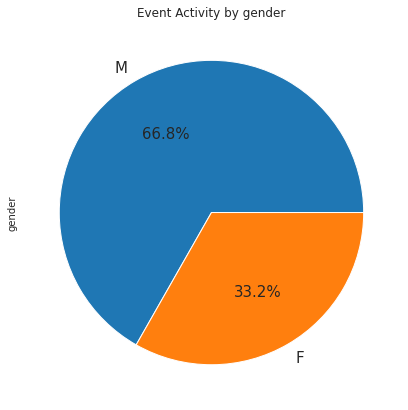

In [ ]:
df_usage_mh.gender.value_counts().plot(kind='pie',autopct='%1.1f%%',
                                     title='Event Activity by gender'
                                     ,figsize =(10, 7)
                                     ,fontsize=15)

Observations:  
**Male users Greater than Female users**:
  * Male User percentage   : 66.8 % <br>
  * Female User percentage : 33.2 %

<a id=section60104></a>
#### 6.1.4 Usage By Group

<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Event Activity By Group')

Text(0.5, 0, 'Group')

Text(0, 0.5, 'People count of particular group')

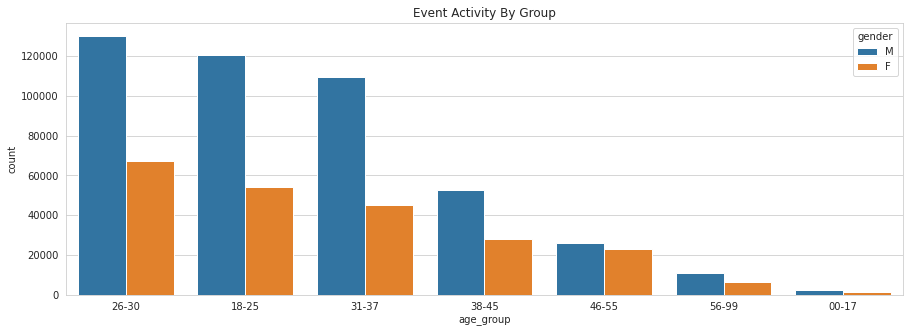

In [ ]:
plt.figure(figsize=(15,5))
plt.title('Event Activity By Group')
plt.xlabel('Group')
plt.ylabel('People count of particular group')
sns.countplot('age_group', data = df_usage_mh, hue='gender', order=df_usage_mh.age_group.value_counts().index)

Observation:
* It is not a balanced dataset in terms of gender.
* The number of points for Male age groups is more than Female age groups.
* The usage is high for the age group of 18-37 years for both Male and Female.

<a id=section60105></a>
#### 6.1.5 Usage By Top 10 City

In [ ]:
# Count of events in the top 10 cities
df_usage_mh['city'].value_counts().sort_values(ascending=False).head(10)
df_usage_mh.shape

Pune             317276
Mumbai           285246
NaviMumbai         1760
SangliMiraj        1737
Wardha             1674
Nagpur             1589
Dhule              1572
Warud              1536
MiraBhayandar      1443
Nanded             1433
Name: city, dtype: int64

(677168, 13)

Text(0.5, 1.0, 'Distribution of Users in top 10 cities')

Text(0.5, 0, 'Number of Users')

<Figure size 1080x360 with 0 Axes>

Text(317276.3, 0.13, '46.85%')

Text(285246.3, 1.13, '42.12%')

Text(1760.3, 2.13, '0.26%')

Text(1737.3, 3.13, '0.26%')

Text(1674.3, 4.13, '0.25%')

Text(1589.3, 5.13, '0.23%')

Text(1572.3, 6.13, '0.23%')

Text(1536.3, 7.13, '0.23%')

Text(1443.3, 8.13, '0.21%')

Text(1433.3, 9.13, '0.21%')

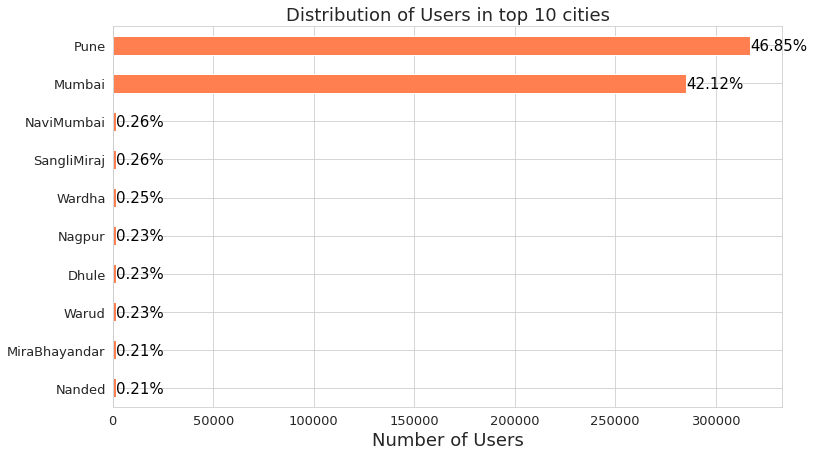

<Figure size 1080x360 with 0 Axes>

In [ ]:
# Plot of count of users with percentage for the top 10 cities

ax = df_usage_mh.city.value_counts().head(10).plot(kind='barh', figsize=(12,7), color="coral", fontsize=13);
ax.set_alpha(0.8)
plt.title("Distribution of Users in top 10 cities", fontsize=18)
plt.xlabel("Number of Users", fontsize=18);
plt.figure(figsize=(15,5))
# set individual bar lables using above list
for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width()+.3, i.get_y()+.38, str(round((i.get_width()/677168)*100, 2))+'%', fontsize=15,color='black')
# invert for largest on top 
ax.invert_yaxis()

Observations:
*  We have 87 distinct cities in the Maharashtra users data. 
*  From the above plot, we infer a total of almost 89% of the usage was recorded in Pune & Mumbai city
*  All other cities contribute less than 0.3% each.

<a id=section60106></a>
#### 6.1.6 Usage Peak Hours

In [ ]:
df_usage_mh["event_hour"] = [t.hour for t in pd.DatetimeIndex(df_usage_mh.timestamp)]
df_usage_mh.head()

usage_byeventhour = df_usage_mh.groupby(['event_hour'])['event_id'].count().reset_index()
usage_byeventhour = usage_byeventhour.rename(columns={'event_id': 'eventcounts'})
usage_byeventhour.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,phone_brand,device_model,gender,age,group,age_group,event_hour
0,720049,4928555839839669963,2016-05-06 19:00:52,72.8448,18.9749,Mumbai,Maharashtra,vivo,X5L,M,33,M32-38,31-37,19
1,13998,3978025911571213813,2016-05-06 13:12:42,73.8752,18.6158,Pune,Maharashtra,Samsung,Galaxy S3,M,19,M6-22,18-25,13
2,1378252,-4384473680693400537,2016-05-05 04:20:02,73.9142,18.6191,Pune,Maharashtra,Huawei,Honor 3C,M,25,M23-26,18-25,4
3,185325,-7369689650429994275,2016-05-02 20:07:07,72.8746,19.0145,Mumbai,Maharashtra,Huawei,Honor Play 4C,M,23,M23-26,18-25,20
4,1861432,3965810796882254829,2016-05-02 20:49:13,73.9388,18.5828,Pune,Maharashtra,vivo,Y18L,F,19,F13-23,18-25,20


,event_hour,eventcounts
0,0,22478
1,1,13498
2,2,10351
3,3,10718
4,4,10760


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Usage Peak Hours')

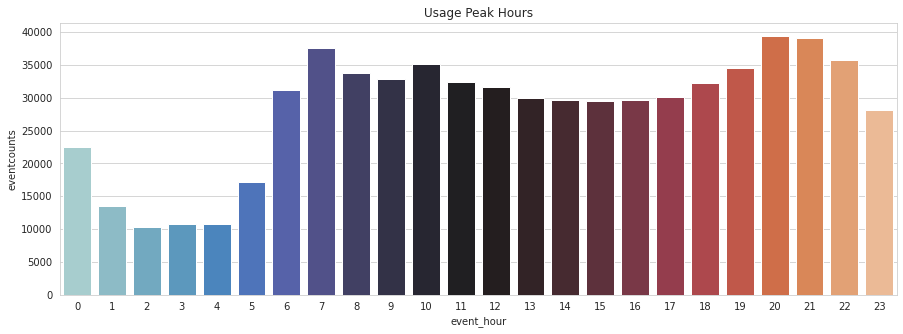

In [ ]:
plt.figure(figsize=(15,5))
sns.barplot(data = usage_byeventhour, x = 'event_hour', y = 'eventcounts', palette = 'icefire')
plt.title('Usage Peak Hours')

Obsevations:
* We infer that peak hours are in the morning's (7 - 10 AM) and in the evening (7- 10PM)



<a id=section602></a>
### 6.2 EDA Based on Users

<a id=section60201></a>
#### 6.2.1 Distribution of Users in the top 10 cities

In [ ]:
# Count of users in the top 10 cities
df_users_mh['city'].value_counts().sort_values(ascending=False).head(10)

Mumbai         4596
Pune           1548
NaviMumbai       74
Amalner          46
Kolhapur         44
Nalasopara       44
Barsi            43
Thana            43
Osmanabad        42
SangliMiraj      42
Name: city, dtype: int64

Text(0.5, 1.0, 'Distribution of Users in top 10 cities')

Text(0.5, 0, 'Number of Users')

Text(4596.3, 0.13, '51.01%')

Text(1548.3, 1.13, '17.18%')

Text(74.3, 2.13, '0.82%')

Text(46.3, 3.13, '0.51%')

Text(44.3, 4.13, '0.49%')

Text(44.3, 5.13, '0.49%')

Text(43.3, 6.13, '0.48%')

Text(43.3, 7.13, '0.48%')

Text(42.3, 8.13, '0.47%')

Text(42.3, 9.13, '0.47%')

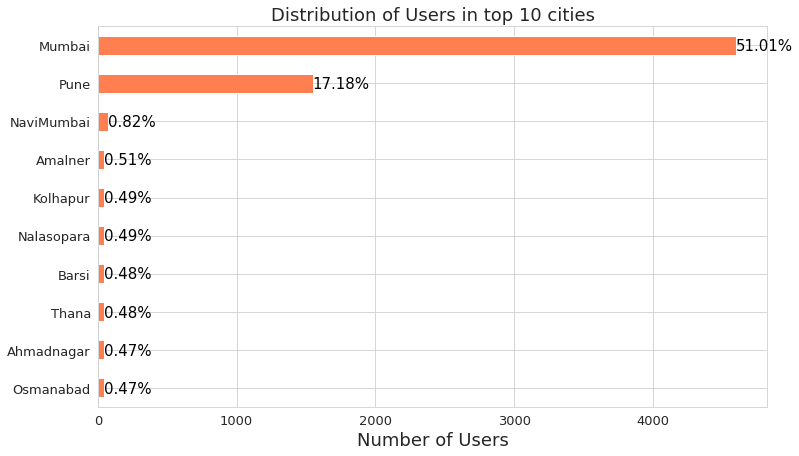

In [ ]:
# Plot of count of users with percentage for the top 10 cities

ax = df_users_mh.city.value_counts().head(10).plot(kind='barh', figsize=(12,7),
                                        color="coral", fontsize=13);
ax.set_alpha(0.8)
plt.title("Distribution of Users in top 10 cities", fontsize=18)
plt.xlabel("Number of Users", fontsize=18);
# set individual bar lables using above list
for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width()+.3, i.get_y()+.38, str(round((i.get_width()/9010)*100, 2))+'%', fontsize=15,color='black')
# invert for largest on top 
ax.invert_yaxis()

Observations:
*  We have 87 distinct cities in the Maharashtra users data. 
*  From the above plot, we infer that 51.01% odd users are from Mumbai followed by 17.18% of users from Pune. 
*  All other cities contribute less than 1% each.

In [ ]:
long_mode = df_users_mh[df_users_mh.city == 'Mumbai']['longitude'].mode()[0]
lat_mode = df_users_mh[df_users_mh.city == 'Mumbai']['latitude'].mode()[0]
display(lat_mode)
display(long_mode)

18.9862

72.9002

In [ ]:
# Plotting latitude & longitude values in map using Folium
map_vis1 = folium.Map(location=[lat_mode, long_mode], zoom_start=6, tiles='Stamen Terrain')

for lat, lon, city, state in zip(df_users_mh['latitude'], df_users_mh['longitude'], df_users_mh['city'], df_users_mh['state']):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup = ('City: ' + str(city).capitalize() + '<br>'
                 'State: ' + str(state) + '<br>'
                 'Latitude: ' + str(lat) + '<br>'
                 'Longitude: ' + str(lon) + '<br>'
                ),
        color='blue',
        threshold_scale=[0,1,2,3],
        fill=True,
        fill_opacity=0.7
        ).add_to(map_vis1)

In [ ]:
map_vis1

Observations:
*  Users are well distributed across the maharashtra state and we see that most of the users are from Mumbai and Pune.

<a id=section60202></a>
#### 6.2.2 Distribution of Users by Age

<Figure size 1800x360 with 0 Axes>

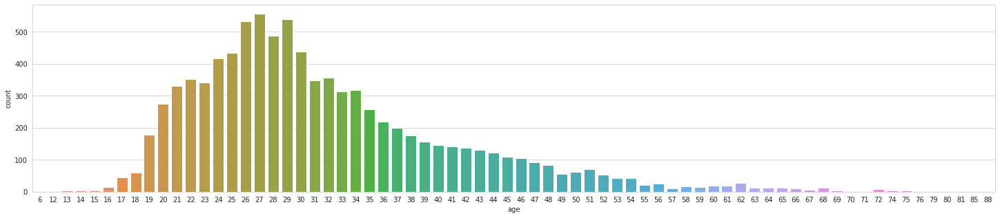

In [ ]:
plt.figure(figsize=(25,5))
sns.countplot(df_users_mh.age, data =df_users_mh)

Observations:
*  It indicates that the distribution of users by age is right skewed meaning we find there are less number of elderly users and Most of the users lie between an age range of 18 and 40.


<a id=section60203></a>
#### 6.2.3 Distribution of Users by Gender

<Figure size 1440x504 with 0 Axes>

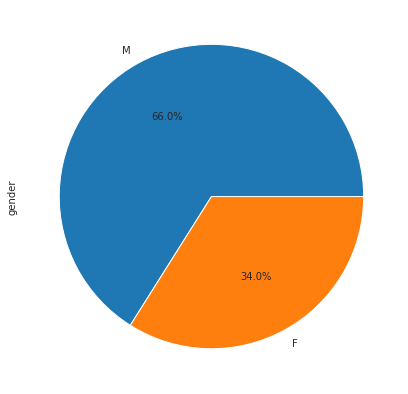

In [ ]:
plt.figure(figsize=(20,7))
df_users_mh.gender.value_counts().plot(kind = 'pie', autopct='%1.1f%%')

Observations:
*  We infer that 66% of users are Male and 34% users are Female.

<a id=section60204></a>
#### 6.2.4 Distribution of Users by Age Group and Gender

Text(0.5, 1.0, 'Distribution of Female Users by Age Group')

Text(0.5, 1.0, 'Distribution of Male Users by Age Group')

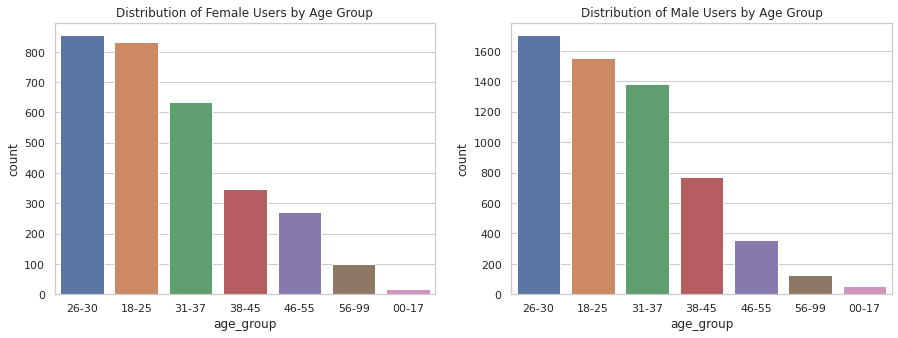

In [ ]:
df_users_mh_fm = df_users_mh[df_users_mh['gender']=='F']
df_users_mh_m = df_users_mh[df_users_mh['gender']=='M']
sns.set(style='whitegrid')
fig, ax = plt.subplots(1, 2,figsize=(15,5))
plt.subplot(1,2,1)                                               
sns.countplot(df_users_mh_fm["age_group"], order = df_users_mh_fm['age_group'].value_counts().index)
plt.title('Distribution of Female Users by Age Group')
plt.subplot(1,2,2)                                               
sns.countplot(df_users_mh_m["age_group"], order = df_users_mh_m['age_group'].value_counts().index)
plt.title('Distribution of Male Users by Age Group')
plt.show()

Observations:
*  We infer that, both Male and Female users are mostly in the age range of 18 - 30 years.

<a id=section60205></a>
#### 6.2.5 Distribution of Users by top 20 Phone Brands

In [ ]:
display(df_users_mh.phone_brand.value_counts().sort_values(ascending = False).head(20))
print('Total Number of Phone Brands: ', df_users_mh.phone_brand.nunique())

Xiaomi          2200
Samsung         1889
Huawei          1628
vivo             763
OPPO             715
Meizu            617
Cool             394
HTC              116
LeTV             103
Lenovo            97
Nubia             46
LG                38
One Plus          31
Hammer            31
TCL               25
China Mobile      24
Duowei            23
Qiku              23
Tianyu            22
Umi               20
Name: phone_brand, dtype: int64

Total Number of Phone Brands:  77


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Distribution of Users with top 20 brands')

Text(0.5, 0, 'Number of Users')

Text(2200.3, 0.13, '24.42%')

Text(1889.3, 1.13, '20.97%')

Text(1628.3, 2.13, '18.07%')

Text(763.3, 3.13, '8.47%')

Text(715.3, 4.13, '7.94%')

Text(617.3, 5.13, '6.85%')

Text(394.3, 6.13, '4.37%')

Text(116.3, 7.13, '1.29%')

Text(103.3, 8.13, '1.14%')

Text(97.3, 9.13, '1.08%')

Text(46.3, 10.13, '0.51%')

Text(38.3, 11.13, '0.42%')

Text(31.3, 12.13, '0.34%')

Text(31.3, 13.13, '0.34%')

Text(25.3, 14.13, '0.28%')

Text(24.3, 15.13, '0.27%')

Text(23.3, 16.13, '0.26%')

Text(23.3, 17.13, '0.26%')

Text(22.3, 18.13, '0.24%')

Text(20.3, 19.13, '0.22%')

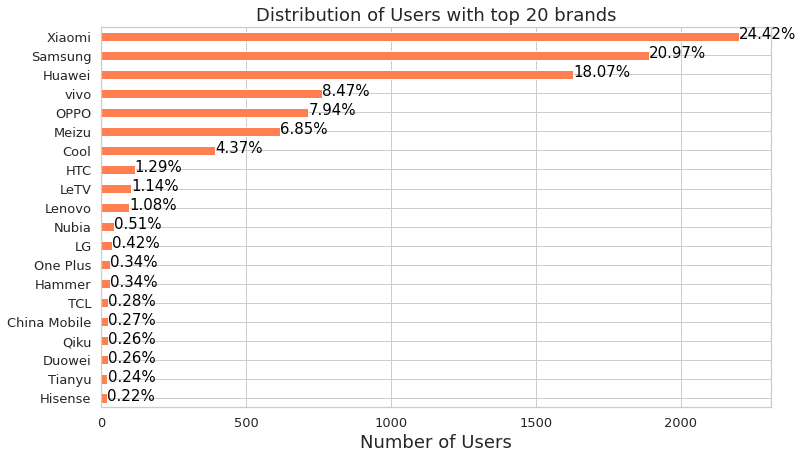

In [ ]:
plt.figure(figsize=(15,5))
# Plot of count of users with percentage for the top 20 brands

ax = df_users_mh.phone_brand.value_counts().head(20).plot(kind='barh', figsize=(12,7),
                                        color="coral", fontsize=13);
ax.set_alpha(0.8)
plt.title("Distribution of Users with top 20 brands", fontsize=18)
plt.xlabel("Number of Users", fontsize=18);
# set individual bar lables using above list
for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width()+.3, i.get_y()+.38, str(round((i.get_width()/9010)*100, 2))+'%', fontsize=15,color='black')
# invert for largest on top 
ax.invert_yaxis()
plt.show()

Observations:  
*  There are 77 distinct phone brands.
*  Maximum number of users use Xiaomi, closely followed by Samsung & Huawei branded phones. These 3 phone brands totally account for ~60% users.
*  The 7 phone brands (Xiaomi, Samsung, Huawei, vivo, OPPO, Meizu, Cool) totally account for ~90% users.
*  All other phone brands contribute less than 1.5% each.

<a id=section60206></a>
#### 6.2.6 Distribution of Users by top 50 Device Models

In [ ]:
display(df_users_mh.device_model.value_counts().sort_values(ascending = False).head(20))
print('Total Number of Device Model: ', df_users_mh.device_model.nunique())

Redmi Note           337
MI 4                 251
Galaxy Note 3        247
MI 3                 247
MI 2S                237
Galaxy S4            200
Galaxy Note 2        180
Honor 6              178
Mate 7               148
Honor Play 4X        137
Redmi Note2          130
Honor 3C             120
Redmi 1S             115
Charm Blue NOTE      110
Redmi                106
Galaxy S5            105
Redmi 2              102
Galaxy S3             99
Redmi 2A              95
Charm Blue Note 2     92
Name: device_model, dtype: int64

Total Number of Device Model:  842


<Figure size 1080x360 with 0 Axes>

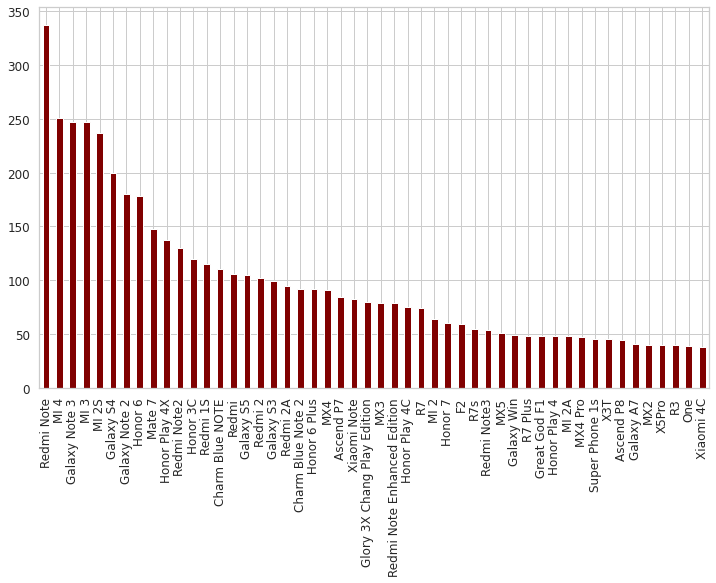

In [ ]:
plt.figure(figsize=(15,5))
# Plot of count of users with percentage for the top 20 brands
df_users_mh.device_model.value_counts().head(50).plot(kind='bar', figsize=(12,7), color="maroon", fontsize=12);
plt.show()

Observations:  
*  We infer that, users use more of Redmi Note followed by MI 4, MI 3 and Galaxy Note 3 phone models.

<a id=section60207></a>
#### 6.2.7 Distribution of users in Mumbai and Pune by age group and gender

Text(0.5, 1.0, 'Distribution of users by age group & gender in Mumbai')

Text(0.5, 1.0, 'Distribution of users by age group & gender in Pune')

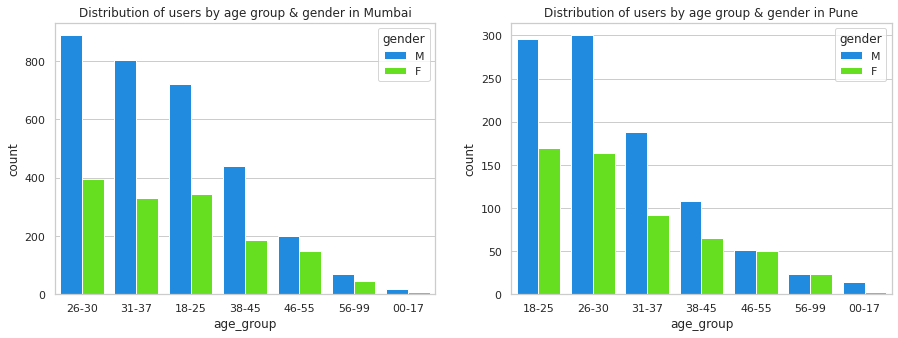

In [ ]:
df_users_mh_city_mum = df_users_mh.loc[df_users_mh.city=='Mumbai']
df_users_mh_city_pun = df_users_mh.loc[df_users_mh.city=='Pune']
fig, ax = plt.subplots(1, 2,figsize=(15,5))
plt.subplot(1,2,1)                                               
sns.countplot(x = 'age_group', data = df_users_mh_city_mum, hue = 'gender', order = df_users_mh_city_mum.age_group.value_counts().index, palette= 'gist_rainbow_r')
plt.title('Distribution of users by age group & gender in Mumbai')
plt.subplot(1,2,2)                                               
sns.countplot(x = 'age_group', data = df_users_mh_city_pun, hue = 'gender', order = df_users_mh_city_pun.age_group.value_counts().index, palette= 'gist_rainbow_r')
plt.title('Distribution of users by age group & gender in Pune')

Observations:
*  Both Male and Female users are more in Mumbai than in Pune.
*  Male users are more than female users in both the cities.
*  In Mumbai city:
   *  Both Male and Female users are mostly in the age group of 18 - 37 years.
*  In Pune city:
   *  Both Male and Female users are mostly in the age group of 18 - 30 years.

<a id=section60208></a>
#### 6.2.8 Distribution of users in Mumbai and Pune by Phone brand

Text(0.5, 1.0, 'Distribution of users by phone brand in Mumbai')

Text(0.5, 1.0, 'Distribution of users by phone brand in Pune')

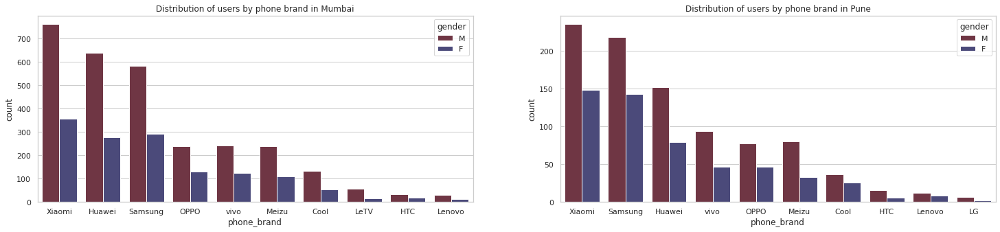

In [ ]:
fig, ax = plt.subplots(1, 2,figsize=(25,5))
plt.subplot(1,2,1)                                               
sns.countplot(x = 'phone_brand', data = df_users_mh_city_mum, hue = 'gender', order = df_users_mh_city_mum.phone_brand.value_counts().head(10).index, palette= 'icefire_r')
plt.title('Distribution of users by phone brand in Mumbai')
plt.subplot(1,2,2)                                               
sns.countplot(x = 'phone_brand', data = df_users_mh_city_pun, hue = 'gender', order = df_users_mh_city_pun.phone_brand.value_counts().head(10).index, palette= 'icefire_r')
plt.title('Distribution of users by phone brand in Pune')

Observations:
*  Both Male and Female users mostly use Xiaomi, Huawei and Samsung branded phones in both the cities.
*  Top 7 phone brands are same in Mumbai and Pune.
*  Huawei beats Samsung to second place in the commercial capital Mumbai and vice versa in Pune.
*  OPPO and Vivo bags 4th and 5th place in Mumbai and vice versa in Pune.
*  LeTV brand phones make it to top 10 list in Mumbai while its replaced with LG in Pune.

<a id=section60209></a>
#### 6.2.9 Distribution of users phone brand in Mumbai and Pune by Age and Gender

Text(0.5, 1.0, 'Distribution of users age and gender by phone brand in Mumbai')

Text(0.5, 1.0, 'Distribution of users age and gender by phone brand in Pune')

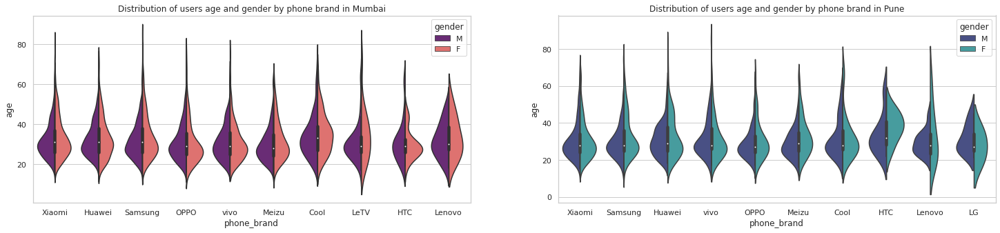

In [ ]:
fig, ax = plt.subplots(1, 2,figsize=(25,5))
plt.subplot(1,2,1)                                            
sns.violinplot(x = 'phone_brand', data = df_users_mh_city_mum, y = 'age', hue = 'gender', split = True, order = df_users_mh_city_mum.phone_brand.value_counts().head(10).index, palette= 'magma')
plt.title('Distribution of users age and gender by phone brand in Mumbai')
plt.subplot(1,2,2)                                               
sns.violinplot(x = 'phone_brand', data = df_users_mh_city_pun, y = 'age', hue = 'gender', split = True, order = df_users_mh_city_pun.phone_brand.value_counts().head(10).index, palette= 'mako')
plt.title('Distribution of users age and gender by phone brand in Pune')

Observations:
*  We infer that, median age of all top 10 phonebrands are almost same and is in the range of 25 - 35 years in both the cities. 
* The top 6 phone brands are used by both Male and Female users equally and are mostly in the range of 20 - 40 years in Mumbai city.
* Female youngsters use more of HTC brands than male in Mumbai.
* The top 7 phone brands are used by both Male and Female users equally and are mostly in the range of 20 - 40 years in Pune city.
* Lenovo is less preferred by female users in Pune city.
* Male youngters and Middle aged Female users prefer HTC phone brands in Pune city.

<a id=section60210></a>
#### 6.2.10. Distribution of users in Mumbai and Pune by Device Model

Text(0.5, 1.0, 'Distribution of users by device model in Mumbai')

Text(0.5, 1.0, 'Distribution of users by device model in Pune')

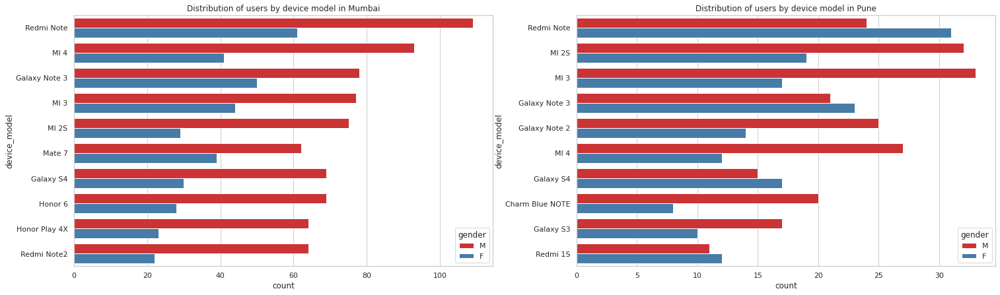

In [ ]:
fig, ax = plt.subplots(1, 2,figsize=(25,7))
plt.subplot(1,2,1)                                               
sns.countplot(y = 'device_model', data = df_users_mh_city_mum, hue = 'gender', order = df_users_mh_city_mum.device_model.value_counts().head(10).index, palette= 'Set1')
plt.title('Distribution of users by device model in Mumbai')
plt.subplot(1,2,2)                                               
sns.countplot(y = 'device_model', data = df_users_mh_city_pun, hue = 'gender', order = df_users_mh_city_pun.device_model.value_counts().head(10).index, palette= 'Set1')
plt.title('Distribution of users by device model in Pune')

Observations:
*  Male users in Mumbai mostly prefers Redmi Note and MI4.
*  Male users in Pune mostly prefer MI3 and MI 2S
*  Female users in both the cities mostly prefers Redmi Note and Galaxy Note 3.

<a id=section603></a>
### 6.3 Based on Phone Brand and Timestamp

<a id=section60301></a>
#### 6.3.1 Market share of Top 10 Brands By All Age Group

Text(0.5, 1.0, 'Top 10 Phone Brand Distribution Across 31-37group for Male and Female')

Text(0.5, 1.0, 'Top 10 Phone Brand Distribution Across 18-25group for Male and Female')

Text(0.5, 1.0, 'Top 10 Phone Brand Distribution Across 26-30group for Male and Female')

Text(0.5, 1.0, 'Top 10 Phone Brand Distribution Across 46-55group for Male and Female')

Text(0.5, 1.0, 'Top 10 Phone Brand Distribution Across 56-99group for Male and Female')

Text(0.5, 1.0, 'Top 10 Phone Brand Distribution Across 38-45group for Male and Female')

Text(0.5, 1.0, 'Top 10 Phone Brand Distribution Across 00-17group for Male and Female')

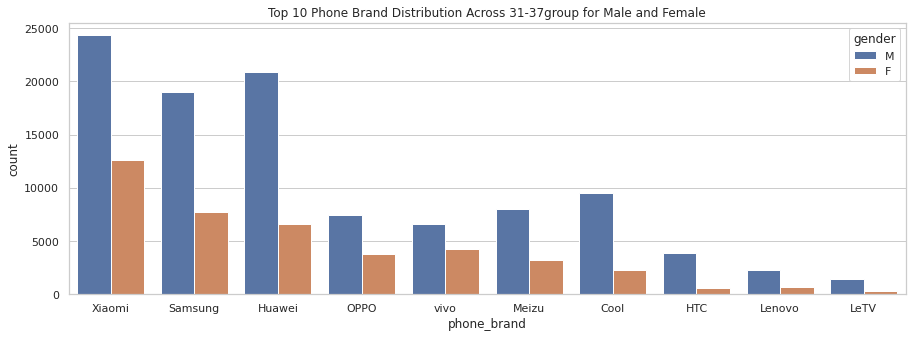

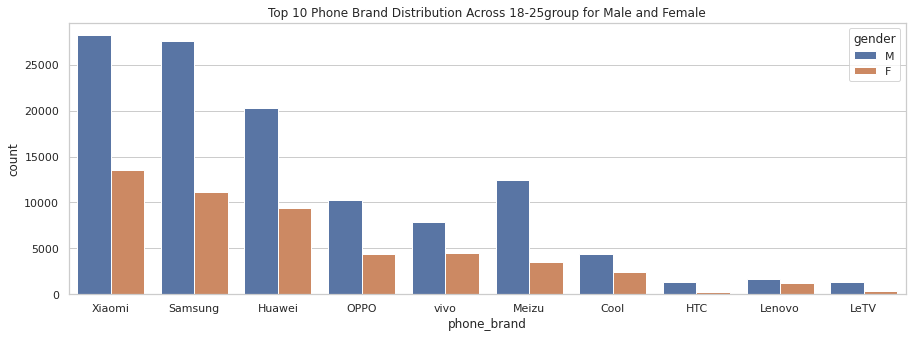

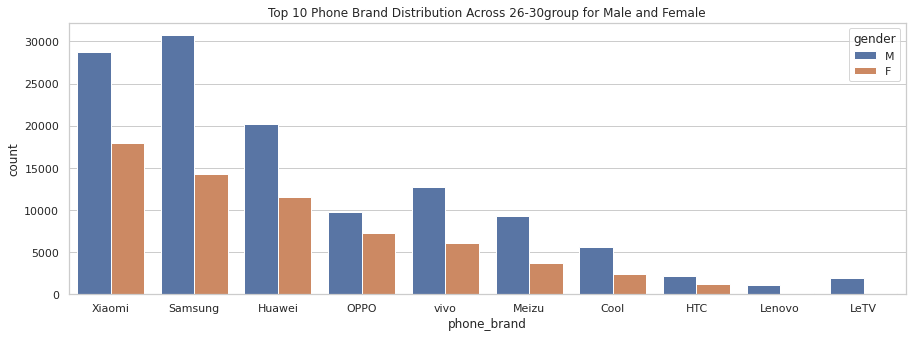

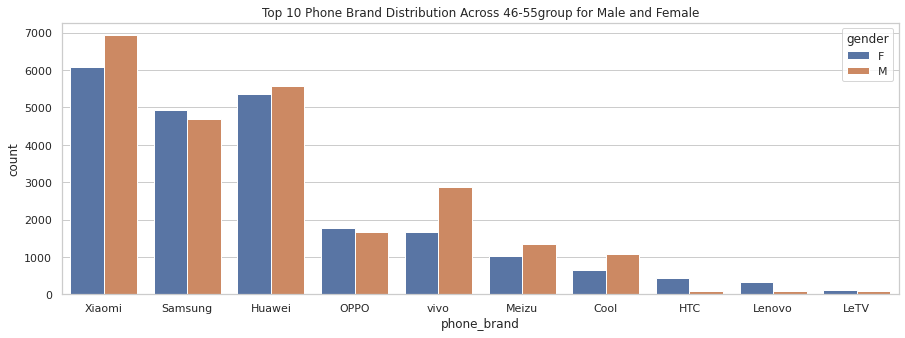

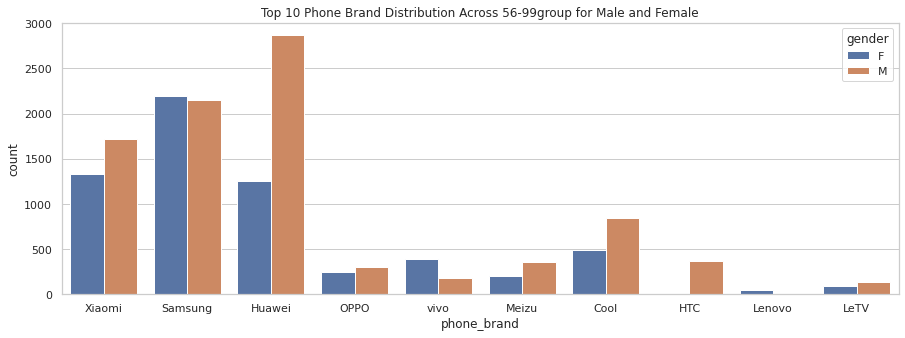

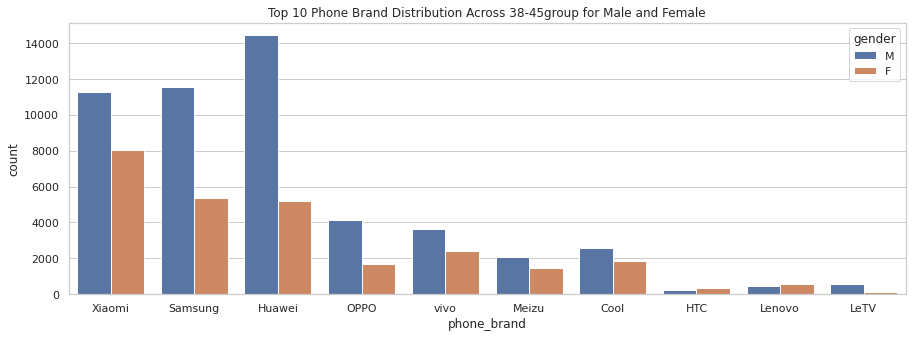

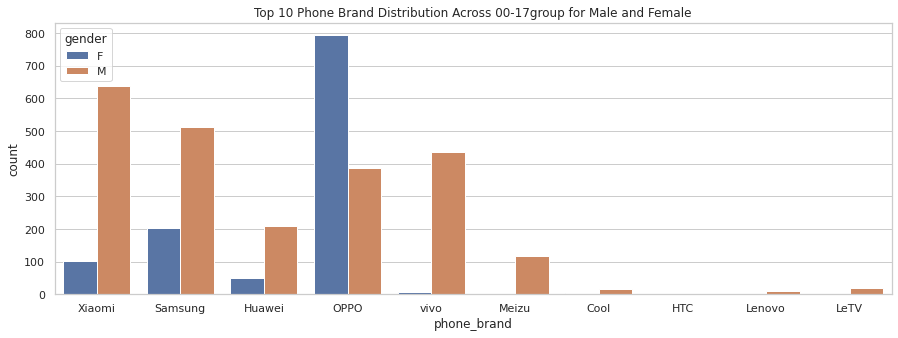

In [ ]:
for i in df_usage_mh['age_group'].unique():
    fig, axis1 = plt.subplots(1,1,figsize=(15,5))
    sns.countplot(x='phone_brand' ,order=df_usage_mh.phone_brand.value_counts().iloc[:10].index, data=df_usage_mh[df_usage_mh['age_group']==i], hue = 'gender', ax=axis1)
    plt.title("Top 10 Phone Brand Distribution Across " + i + "group for Male and Female")

Observations:
*  Male users, mostly use Xiaomi, Samsung, Huawei and OPPO for varius age groups.
*  Female users, for any age group, they are likely to use Xiaomi, Samsung, Huawei and Vivo.

<a id=section60302></a>
#### 6.3.2 Peak Hours Usage Based on Gender

In [ ]:
plt.figure(figsize=(15,8))
sns.countplot("hour", hue="gender", hue_order=df_usage_mh.gender.value_counts().iloc[:].index, data=df_usage_mh)
plt.title("Hourly event distribution for each gender")

- The pattern of frequency distribution of calls is similar between the two genders.
- However, the peak hours for males tend to have much higher magnitude compared to the other hours. In other words, activity of males vary a lot between peak and non-peak hours, compared to the activity of females.

<a id=section60303></a>
#### 6.3.3 Peak Hours Usage Based on City

<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Hourly call distribution for top 2 cities')

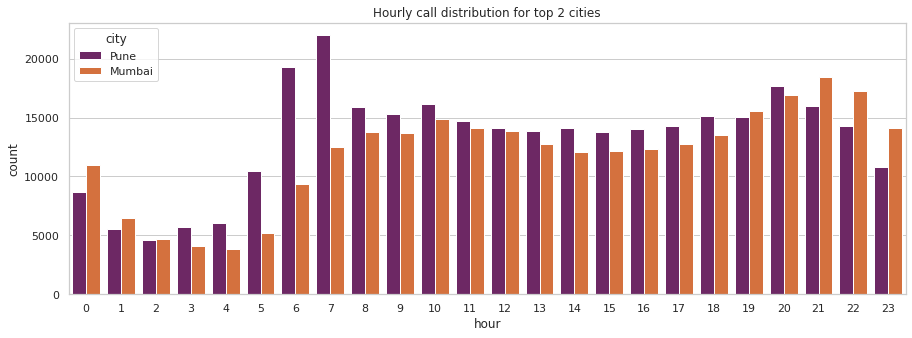

In [ ]:
df_usage_mh['hour']= pd.to_datetime(df_usage_mh['timestamp']).dt.hour
plt.figure(figsize=(15,5))
sns.countplot("hour", hue="city", hue_order=df_usage_mh.city.value_counts().iloc[:2].index, data=df_usage_mh, palette='inferno')
plt.title("Hourly event distribution for top 2 cities")

Observations:
- First we notice that for morning hours like 5 am, 6 am and 7 am Pune users make a huge number of events compared to their counterparts from Mumbai.
- Users from Pune continue to marginally dominate over the Mumbai user all throughout the day uptill 8 pm at night.
- After that, from 9 pm to 2 am at night, we have a greater number of events being made by users of Mumbai.
- So people from Pune make a lot of events during early morning hours while their Mumbai counterparts make more events late at night.
- We should notice that the overall number of events made by the users from these 2 cities are quite close. However, the number of users in Mumbai was almost thrice of that in Pune. This means, number of events made per user in Pune is almost three times that of users in Mumbai.

<a id=section60304></a>
#### 6.3.4 Peak Hours Usage Based on Age

Text(0.5, 0, 'Hour of the Day')

Text(0, 0.5, 'Age')

Text(0.5, 1.0, 'Hexplot showing the variation of Hour with Age')

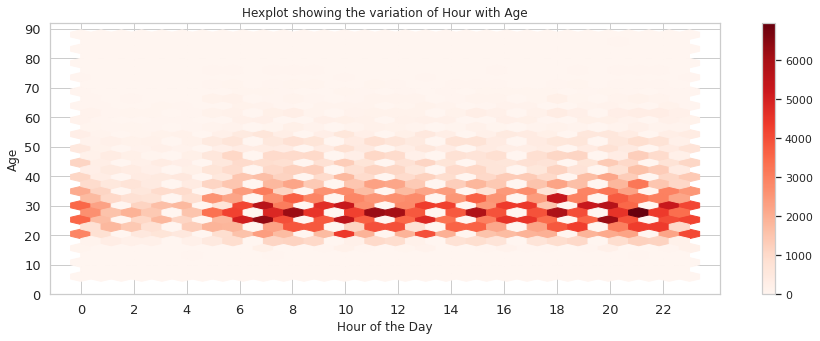

In [ ]:
df_usage_mh.plot(kind='hexbin', x='hour', y='age', figsize=(15, 5), gridsize=30, fontsize=13, colormap='Reds', xticks=np.arange(0,24,2), yticks=np.arange(0, 100, 10), sharex=False, grid=True)

plt.xlabel('Hour of the Day')
plt.ylabel('Age')
plt.title('Hexplot showing the variation of Hour with Age')

Observations:
- We find that people in the mid and late twenties post the highest number of phone activities from peak hour perspective, followed by people around the age of thirty.
- Lesser but still significant contribution is made by users in their early thirties followed by early twenties respectively.
- Users in the late twenties post the highest activity overall at around 9 pm.
- Other peak times for peple in late twenties are 8 am, 11 am, 12 pm, 3 pm and 6 pm.
- Users in mid twenties have peak hours between 6 am to 7 am, 10 am and 8 pm.
- People in their early thirties are highly active between 6 am to 7 am, 9 am to 10 am, 7 pm to 8 pm and at 10 pm.
- People in their early twenties are most active between 8 am to 9 am, 11 am to 12 pm, 6 pm to 7 pm and 9 pm to 10 pm.

<a id=section60305></a>
#### 6.3.5 Peak Hours Usage Based on Age Group

In [ ]:
df_usage_mh_age0017 = df_usage_mh[df_usage_mh['age_group']=='00-17']
df_usage_mh_age1825 = df_usage_mh[df_usage_mh['age_group']=='18-25']
df_usage_mh_age2630 = df_usage_mh[df_usage_mh['age_group']=='26-30']
df_usage_mh_age3137 = df_usage_mh[df_usage_mh['age_group']=='31-37']
df_usage_mh_age3845 = df_usage_mh[df_usage_mh['age_group']=='38-45']
df_usage_mh_age4655 = df_usage_mh[df_usage_mh['age_group']=='46-55']
df_usage_mh_age5699 = df_usage_mh[df_usage_mh['age_group']=='56-99']

Text(0.5, 0, 'Hour of the Day')

Text(0, 0.5, 'Frequency of Phone Calls')

Text(0.5, 1.0, 'Line Chart showing Frequency of Phone Calls Against Hour of the Day for various Age Groups')

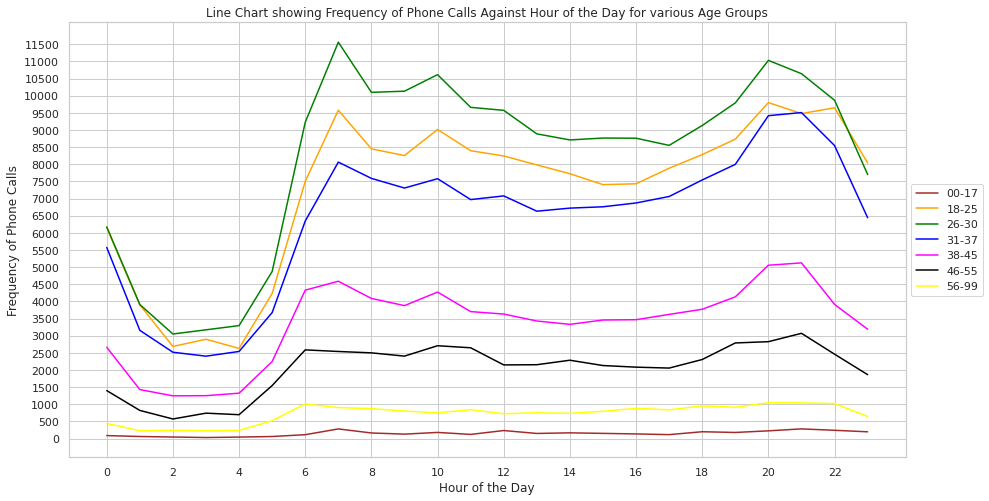

In [ ]:
df_usage_mh_age0017.groupby('hour')['event_id'].count().plot(kind='line', figsize=(15, 8), color='brown', xticks=np.arange(0,24,2), yticks=np.arange(0, 12000, 500), label='00-17')
df_usage_mh_age1825.groupby('hour')['event_id'].count().plot(kind='line', figsize=(15, 8), color='orange', xticks=np.arange(0,24,2), yticks=np.arange(0, 12000, 500), label='18-25')
df_usage_mh_age2630.groupby('hour')['event_id'].count().plot(kind='line', figsize=(15, 8), color='green', xticks=np.arange(0,24,2), yticks=np.arange(0, 12000, 500), label='26-30')
df_usage_mh_age3137.groupby('hour')['event_id'].count().plot(kind='line', figsize=(15, 8), color='blue', xticks=np.arange(0,24,2), yticks=np.arange(0, 12000, 500), label='31-37')
df_usage_mh_age3845.groupby('hour')['event_id'].count().plot(kind='line', figsize=(15, 8), color='magenta', xticks=np.arange(0,24,2), yticks=np.arange(0, 12000, 500), label='38-45')
df_usage_mh_age4655.groupby('hour')['event_id'].count().plot(kind='line', figsize=(15, 8), color='black', xticks=np.arange(0,24,2), yticks=np.arange(0, 12000, 500), label='46-55')
df_usage_mh_age5699.groupby('hour')['event_id'].count().plot(kind='line', figsize=(15, 8), color='yellow', xticks=np.arange(0,24,2), yticks=np.arange(0, 12000, 500), label='56-99')

plt.legend(framealpha=1, frameon=True)
plt.xlabel('Hour of the Day')
plt.ylabel('Frequency of Events')
plt.title('Line Chart showing Frequency of Events Against Hour of the Day for various Age Groups')
plt.gca().legend(loc='center left', bbox_to_anchor=(1, 0.5))


Observations: 
- User groups aged less than 18 (in Brown) and greater than 55 (in Yellow) have relatively less variation in frequency all around the clock.
- Users in age group 46-55 (in Black) has higher presence while age group 38-45 (in Magenta) is further ahead. However these two segments have similar trend of call frequency for the hours in a day. Most activities are made between 6 am to 10 pm, while 6 am to 11 am and 6 pm to 10 pm prove to be the peak hours.
- The remaining three age groups 26-30 (in Green), 18-25 (in Orange) and 31-37 (In Blue) take the 1st, 2nd and 3rd places with significantly higher numbers.
- Users in age range 26-30 have a sharp day time peak hour at 7 am. At night, there is a sharp peak hour at 8 pm. By magnitude 7 am frequency is higher.
- Users in age group 18-25 follow a similar distribution pattern with daytime and night time peaks at 7 am and 8 pm respectively. However the highest figure is obtained at 8 pm.
- Users in age range 31-37 have a wide span of peak hours at night between 7 pm to 10 pm. Daytime numbers are significantly lower, with the morning peak coming at 7 am.

<a id=section60306></a>
#### 6.3.6 Usage By Weekday

In [ ]:
df_usage_mh["weekday"] = df_usage_mh["timestamp"].apply(lambda x:x.strftime("%A"))

In [ ]:
df_usage_mh.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,phone_brand,device_model,gender,age,group,age_group,event_hour,hour,weekday
0,720049,4928555839839669963,2016-05-06 19:00:52,72.8448,18.9749,Mumbai,Maharashtra,vivo,X5L,M,33,M32-38,31-37,19,19,Friday
1,13998,3978025911571213813,2016-05-06 13:12:42,73.8752,18.6158,Pune,Maharashtra,Samsung,Galaxy S3,M,19,M6-22,18-25,13,13,Friday
2,1378252,-4384473680693400537,2016-05-05 04:20:02,73.9142,18.6191,Pune,Maharashtra,Huawei,Honor 3C,M,25,M23-26,18-25,4,4,Thursday
3,185325,-7369689650429994275,2016-05-02 20:07:07,72.8746,19.0145,Mumbai,Maharashtra,Huawei,Honor Play 4C,M,23,M23-26,18-25,20,20,Monday
4,1861432,3965810796882254829,2016-05-02 20:49:13,73.9388,18.5828,Pune,Maharashtra,vivo,Y18L,F,19,F13-23,18-25,20,20,Monday


In [ ]:
usage_byweekday = df_usage_mh.groupby(['weekday'])['event_id'].count().sort_values(ascending = False).reset_index()
usage_byweekday = usage_byweekday.rename(columns={'event_id': 'eventcounts'})
usage_byweekday

,weekday,eventcounts
0,Tuesday,100661
1,Thursday,99934
2,Wednesday,99534
3,Friday,98778
4,Saturday,95224
5,Monday,92641
6,Sunday,90396


<Figure size 1080x360 with 0 Axes>

No handles with labels found to put in legend.


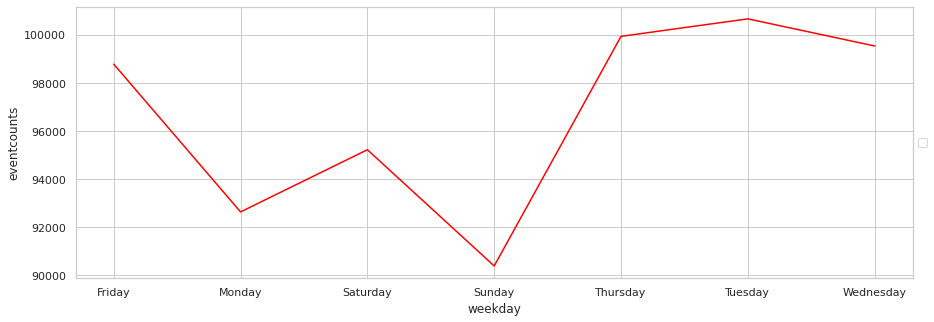

In [ ]:
plt.figure(figsize=(15,5))
sns.lineplot(data = usage_byweekday,x='weekday',y ='eventcounts', color = 'red')
plt.gca().legend(loc='center left', bbox_to_anchor=(1, 0.5))

Observations:
* We infer that, the usage is more on the middle weekdays Tuesday follwed by Thursday, Wednesday and Friday.
*Usage is very less on Sunday and Monday

<a id=section60307></a>
#### 6.3.7 Usage By Weekday for Mubai and Pune

In [ ]:
usage_byweekday_city = df_usage_mh.groupby(['weekday','city'])['event_id'].count().sort_values(ascending = False).reset_index()
usage_byweekday_city = usage_byweekday_city.rename(columns={'event_id': 'eventcounts'})
usage_byweekday_mp = usage_byweekday_city.loc[(usage_byweekday_city.city=='Mumbai') | (usage_byweekday_city.city=='Pune')]

<Figure size 1080x360 with 0 Axes>

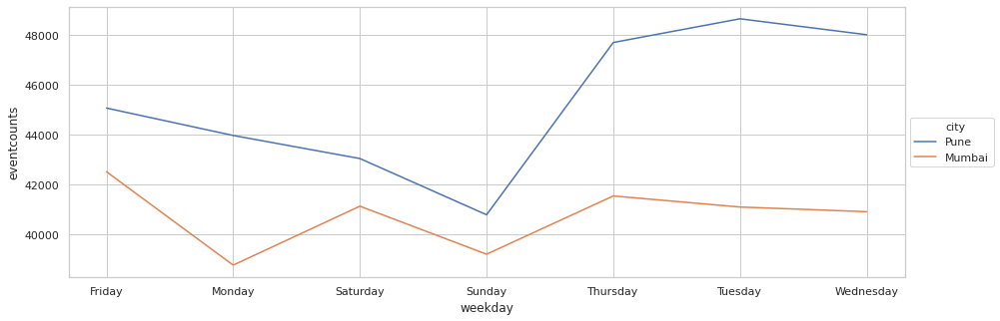

In [ ]:
plt.figure(figsize=(15,5))
sns.lineplot(data = usage_byweekday_mp, x = 'weekday', y = 'eventcounts', hue = 'city')
plt.gca().legend(loc='center left', bbox_to_anchor=(1, 0.5))

Observations:
* For Pune, the usage is high on middle of weekdays Tuesday followed by Wednesday and Thursday while its less on weekends.
* For Mumbai, the usage is high on Friday followed by Thursday and Saturday while its less on Monday.

<a id=section60308></a>
#### 6.3.8 Usage By Weekday and Gender

In [ ]:
usage_byweekday_gender = df_usage_mh.groupby(['weekday','gender'])['event_id'].count().sort_values(ascending = False).reset_index()
usage_byweekday_gender = usage_byweekday_gender.rename(columns={'event_id': 'eventcounts'})
usage_byweekday_gender[usage_byweekday_gender.gender=='F'].sort_values(by = 'eventcounts', ascending=False)

,weekday,gender,eventcounts
7,Wednesday,F,33650
8,Friday,F,33073
9,Thursday,F,33045
10,Tuesday,F,32910
11,Saturday,F,31600
12,Monday,F,30914
13,Sunday,F,29845


Text(0.5, 1.0, 'Usage by Weekday for Female Users')

Text(0.5, 1.0, 'Usage by Weekday for Male Users')

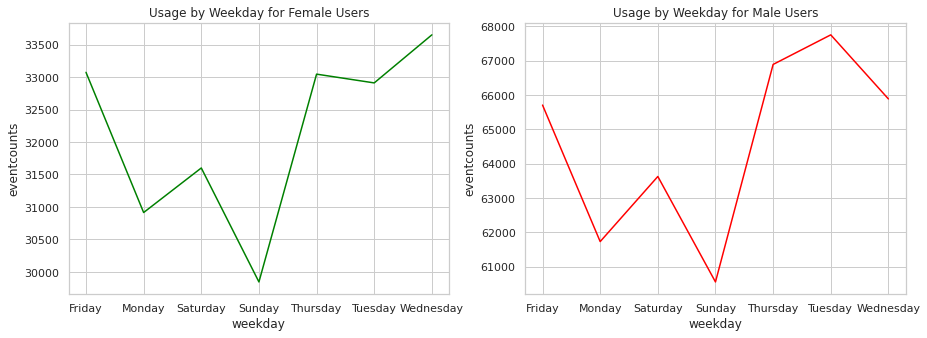

In [ ]:
fig, ax = plt.subplots(1, 2,figsize=(15,5))
plt.subplot(1,2,1)
sns.lineplot(data = usage_byweekday_gender.loc[usage_byweekday_gender.gender=='F'], x='weekday', y ='eventcounts', color = 'Green')
plt.title('Usage by Weekday for Female Users')
plt.subplot(1,2,2)
sns.lineplot(data = usage_byweekday_gender.loc[usage_byweekday_gender.gender=='M'], x='weekday', y ='eventcounts', color = 'Red')
plt.title('Usage by Weekday for Male Users')

Observations:
* We see that usage by male is more than female. 
* Male users usage is more on Tuesday, Thursday and Wednesday while very less on Sunday.
* Female users usage is more on Wednesday followed by Friday and Thursday while very less on Sunday
* Overall, the trend is both Male and Female users use the services less on Weekends (Sunday and Monday) while use more on midddle of the weekdays

<a id=section60309></a>
#### 6.3.9 Usage By Weekday and Age Group

In [ ]:
usage_byweekday_group = df_usage_mh.groupby(['weekday','age_group'])['event_id'].count().sort_values(ascending = False).reset_index()
usage_byweekday_group = usage_byweekday_group.rename(columns={'event_id': 'eventcounts'})

<Figure size 1080x360 with 0 Axes>

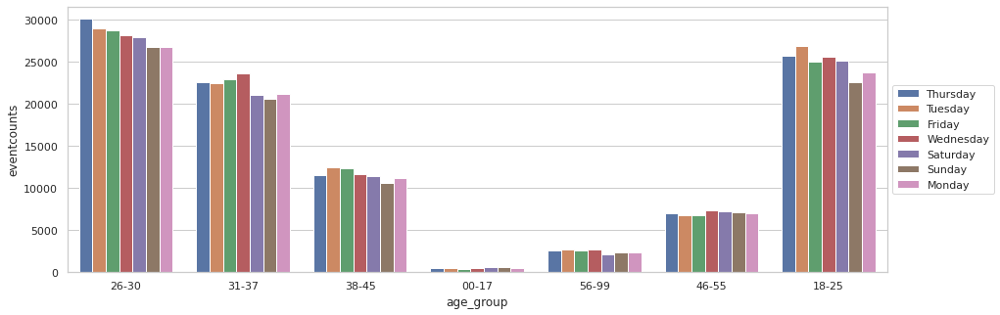

In [ ]:
plt.figure(figsize=(15,5))
sns.barplot(data = usage_byweekday_group.head(150),x='age_group',y ='eventcounts',hue='weekday', alpha = 1, order = usage_byweekday_group.age_group.value_counts().index)
plt.gca().legend(loc='center left', bbox_to_anchor=(1, 0.5))

Observations:
* Age group of 18 - 25 years has high usage on Tuesday and less on Sunday
* Age group of 26 - 30 years has high usage on Thursday and less on Monday.
* Age group of 31 - 37 years has high usage on Wednesday and less on Sunday.
* Age group of 38 - 45 years has high usage on Tuesday and less on Monday.
* Overall we can say that all age groups use the network services in the middle of the week Tuesday, Wednesday, Thursday and Friday while its too less on Weekends and on Monday.


<a id=section7></a>
## 7. Conclusion

1.	User activity density is high mostly between ages 19 and 38. Users in mid twenties up to early thirties post the highest numbers.
2.	User activity is highly dominated by males with respect to females, the ratio being 2:1.
3.	Pune and Mumbai combined bag a whopping 89% of the total user activity with 47% and 42% respectively. Other cities have almost insignificant presence (less than 0.3% each).
4.	Overall, user activity is highest between 7 pm to 10 pm at night followed by, activity during 7 am and 10 am in the morning.
5.	Considering size of user base, Mumbai has more than half of them with 51%, followed by Pune with 17%. The remaining cities have less than 1% users each.
6.	Distribution of users by gender is almost same as for user activity. We have 66% of users as male while the rest 34% are females.
7.	Most user both male as well as females are between the ages 18 and 37 (very similar to overall usage density).
8.	The list of Top brands based on number of user is led by Xiaomi having 42.42%, followed by Samsung with nearly 21%. At 3rd, 4th and 5th places we have Huawei (18%), Vivo (8.5%) and OPPO (8%) respectively with much lesser shares. The top 3 combined have nearly 60% of the total users, while the top 7 have around 90%.
9.	Most popular phone brands based on number of users is given as – Redmi Note followed by MI 4, MI 3 and Galaxy Note 3.
10.	In Mumbai, highest number of both male and female users is between ages 18-37.
11.	In Pune, however, both males and females have biggest user numbers between the ages 18-30.
12.	Both Male and Female users mostly use Xiaomi, Huawei and Samsung branded phones in both the Mumbai and Pune.
13.	Huawei beats Samsung to second place in the commercial capital Mumbai and vice versa in Pune.
14.	OPPO and Vivo bags 4th and 5th place in Mumbai and vice versa in Pune.
15.	In both Mumbai and Pune, users of most of the top brands are equally distributed across gender and are in the age range of 20-40 years.
16.	In Mumbai, HTC is more popular amongst females than males for the younger generation.
17.	Lenovo is less preferred by females in Pune.
18.	Young males and middle-aged females prefer HTC as a phone brand in Pune.
19.	For the males users, ones in Mumbai prefer Redmi Note and MI4 while for Pune it is MI3 and MI 2S.
20.	For the female users in both cities, models Redmi Note and Galaxy Note 3 are the most popular.
21.	People from Pune make a lot of events during early morning hours while their Mumbai counterparts make more events late at night.
22.	More user activities are made by those in mid twenties and early thirties in early morning hours. Users in late and early twenties tend to have later morning hours as peak.
23.	In terms of activities made on each week day, at the start of the week, on Sunday and Monday numbers are poor. It is much higher for the other days.
24.	In Pune, the activity is at its peak is between Tuesday to Thursday. However in Mumbai it is Thursday to Saturday which fetches highest numbers.
